# Рынок заведений общественного питания в Москве

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

Необходимо подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

Для анализа доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. 

***Цель проекта***
1. Изучить в целом рынок завеведений Москвы по разным параметрам (категориям, админисративным районам, средним чекам, количеству посадочных мест, часам работы и т.п.);
2. Детализировать анализ рынка на предмет открытия уютной кофейни. В исследование должно входить исследование подоходящих районов, необходимых часов работы, изучение средней стоимости чашки кофе и изучение отличий сетевых и несетевых кофеен.
3. Составить презентацию для заказчика и дать соответсвующие рекомендации.

***План проекта***
1. Выгрузить данные из файла и изучить общую информацию;
2. Выполнить предобработку данных: обработка пропусков и дубликатов, преобразование типов столбцов и создания новых столбцов для более удобного дальнейшего исследования, поиск аномалий в данных;
3. Сделать анализ данных:
    - общая статистика по всем заведениям;
    - исследование заведений по категориям;
    - исследование заведений по административным районам Москвы;
    - исследование сетевых и несетевых заведений;
    - анализ топ-сетей Москвы;
    - анализ рейтингов заведений по разным критериям;
    - построение карты заведений;
    - анализ среднего чека;
    - часы работы заведений;
4. Сделать детальный разбор рынка заведений кофеен на предмет открытия новой уютной точки:
    - исследование подходящий административных районов;
    - анализ стоимости чашки капучино;
    - изучение подходящих часов работы;
    - изучение рейтингов кофеен;
    - исследование различий сетевых и несетевых кофеен.
5. По детальному разбору кофеен составить презентацию для заказчиков.

[**Презентация**](https://drive.google.com/file/d/1myCkQ7e4sqy2_A6LcV-40P4nUETtkmz6/view?usp=sharing) (Ссылка также есть и внизу документа)

## Загрузка и изучение общей информации

### Импорт библиотек

In [1]:
import pandas as pd
import plotly.express as px 
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import matplotlib.pyplot as plt
import seaborn as sns
from folium.plugins import MarkerCluster
from folium import Map, Choropleth, Marker, Element, DivIcon
import numpy as np
import re
import ipywidgets as widgets
import squarify
from ipywidgets import interact, interact_manual
from scipy import stats

### Загрузка данных
Загрузим данные о заведениях общественного питания Москвы из файлв `/datasets/moscow_places.csv`.

In [2]:
df_moscow_places = pd.read_csv('moscow_places.csv')
df_moscow_places.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


### Изучение общей информации

Выведем общую информацию о датасете.

In [3]:
df_moscow_places.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


### Вывод

Из данных видно, что в датасете найдено **8406 записей** заведений. 

По названиям и количеству явных ненулевых записей заметить, что следующие столбцы предоставлены в полной мере:
- название заведения `name`;
- категория `category`;
- адрес `address`;
- район `district`;
- координаты `lat` и `lng`;
- рейтинг `rating`;
- принадлежность к сети `chain`.

Все остальные столбцы имеют явные пропуски, которые необходимо обработать и понять их причину. 
Также необходимо будет изучить все столбцы на корректность значений.

Также можно преобразавть некоторые типы данных:
- число сидений `seats` в целочисленный;
- принадлежность сети `chain` в булиновый.

## Предобработка данных

Создаими отдельно переменную, где будем делать всю обработку данных.

In [4]:
data = df_moscow_places.copy()

### Анализ дубликатов

Изучим данные на наличие дубликатов, так и по всем фреймам, так и по группе столбцов.

Явных дублиатов не было найдено по всем столбцам.

In [5]:
sum(df_moscow_places.duplicated())

0

#### Анализ дубликатов по названию заведения

Проверим дубликаты по названиями.

In [6]:
sum(df_moscow_places.name.duplicated(keep=False))

3506

Теперь посчитаем количество строковых дубликатов, предварительно переведя все строки в регистр заголовков методом `title`.

In [7]:
sum(df_moscow_places.name.str.title().duplicated(keep=False))

3646

Как видим, число дубликатов увеличилось, соответственно, есть названия заведений, отличающиеся только регистром.

Переведем все строки названий заведений в единную систему регистров заголовков.

In [8]:
data.name = data.name.str.title()

Проверим, что мы сконвертировали все верно, посчитав количество дубликатов.

In [9]:
sum(data.name.duplicated(keep=False))

3646

#### Анализ дубликатов по нескольким столбцам

Проверим датасет на дубликаты по столбцам `name`.

In [10]:
sum(data.duplicated(subset=['name', 'address']))

3

In [11]:
data[data.duplicated(subset=['name', 'address'], keep=False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1430,More Poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0
1511,More Poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2211,Раковарня Клешни И Хвосты,ресторан,"Москва, проспект Мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,0,150.0
2420,Раковарня Клешни И Хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3091,Хлеб Да Выпечка,булочная,"Москва, Ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,1,276.0
3109,Хлеб Да Выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


In [12]:
sum(data.duplicated(subset=['name', 'lat', 'lng']))

1

In [13]:
data[data.duplicated(subset=['name', 'lat', 'lng'], keep=False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1430,More Poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0
1511,More Poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0


По сочетаниям названия заведения `name` и точным адресам `address` или координатам `lat` и `lng` было найдено несколько дубликатов. Это означает, что это одни и те же заведения, но записаные в базу 2 раза.

Очистим датасет от таких дубликатов.

In [14]:
data.drop_duplicates(subset=['name', 'lat', 'lng'], inplace=True)
data.drop_duplicates(subset=['name', 'address'], inplace=True)

In [15]:
sum(data.duplicated(subset=['name', 'address']))

0

In [16]:
sum(data.duplicated(subset=['name', 'lat', 'lng']))

0

#### Анализ дубликатов столбца категорий

Проверим уникальные значения категориального столбца `category`.

In [17]:
sorted(list(df_moscow_places.category.unique()))

['бар,паб',
 'булочная',
 'быстрое питание',
 'кафе',
 'кофейня',
 'пиццерия',
 'ресторан',
 'столовая']

Близких категорий по значению не обнаружено (`кафе` и `кофейня` - это разные типы заведений).

#### Анализ дубликатов столбца административного района

Проверим уникальные значения категориального столбца района `district`.

In [18]:
sorted(list(df_moscow_places.district.unique()))

['Восточный административный округ',
 'Западный административный округ',
 'Северный административный округ',
 'Северо-Восточный административный округ',
 'Северо-Западный административный округ',
 'Центральный административный округ',
 'Юго-Восточный административный округ',
 'Юго-Западный административный округ',
 'Южный административный округ']

Близких категорий по значению района не обнаружено (отпечатков нет).

***Вывод:***

- В датасете не было найдено явных дубликатов в датасете;
- Найдены продублированные записи одних и тех же заведений по столбцам `name` и `adress` и по `name`, `lat` и `lng` (с приведением столбца названия заведения в заголовочный регистр);
- Не было найдено строковых близких значений по категориальным столбцам `category` и `district` (не найдено отпечатков в строковых значениях);

### Анализ и обработка пропусков

#### Пропуски в столбце часов работы `hours`

Посчитаем количество и долю пропусков часов работы `hours`.

In [19]:
print('Количество пропусков часов работы: ', sum(df_moscow_places.hours.isna()))
print('Доля пропусков часов работы: {:.2%}'.format(df_moscow_places.hours.isna().mean()))

Количество пропусков часов работы:  536
Доля пропусков часов работы: 6.38%


Найдено ***более 6%*** пустых значений. Из-за того, что для исследования данных этот столбец не самый важный, то можно заполнить пропуски значением по умолчанию `неизвестно` (значения заполнены на русском, поэтому не будем отклоняться от паттерна). 

In [20]:
data.loc[data.hours.isna(), 'hours'] = 'неизвестно'

In [21]:
print('Доля пропусков столбца \'hours\': {:.2%}'.format(data.hours.isna().mean()))

Доля пропусков столбца 'hours': 0.00%


#### Пропуски в столбце часов работы `seats`

Посчитаем количество и долю пропусков количества поседочных мест `seats`.

In [22]:
print('Количество пропусков часов работы: ', sum(df_moscow_places.seats.isna()))
print('Доля пропусков столбца \'seats\': {:.2%}'.format(df_moscow_places.seats.isna().mean()))

Количество пропусков часов работы:  3611
Доля пропусков столбца 'seats': 42.96%


Найдено ***около 43%*** пропущенных значений, что довольно много.

Изучим возможный характер пропусков по категориям или принадлежности сети.

In [23]:
df_seats_nans = df_moscow_places.groupby('category').agg({'seats': [lambda x: sum(x.isna()), lambda x: x.isna().mean()]})
df_seats_nans.columns = ['nan_count', 'nan_share']
df_seats_nans.sort_values(by='nan_share', ascending=False, inplace=True)
df_seats_nans.style.format({'nan_count': '{:.0f}'.format, 'nan_share': '{:.2%}'.format})

,nan_count,nan_share
category,,
кафе,1160,48.78%
столовая,151,47.94%
кофейня,662,46.85%
булочная,108,42.19%
быстрое питание,254,42.12%
"бар,паб",297,38.82%
ресторан,773,37.84%
пиццерия,206,32.54%


In [24]:
df_seats_nans = df_moscow_places.groupby('chain').agg({'seats': [lambda x: sum(x.isna()), lambda x: x.isna().mean()]})
df_seats_nans.columns = ['nan_count', 'nan_share']
df_seats_nans.sort_values(by='nan_share', ascending=False, inplace=True)
df_seats_nans.style.format({'nan_count': '{:.0f}'.format, 'nan_share': '{:.2%}'.format})

,nan_count,nan_share
chain,,
0,2333,44.86%
1,1278,39.88%


По данным видно, что по категориям и принадлежности есть различия в доле пропусков, однако это больше несет случайных характер. Поэтому пропуски мы заполнять не будем, тем более это не главный фактор при оценке заведений.

### Изменение типа столбца принадлежности сети

Выведем уникальные значения принадлежности сети `chain`.

In [25]:
data.chain.value_counts()

chain
0    5200
1    3203
Name: count, dtype: int64

Данные записаны в виде целочисленного значения chain `0`(Не принадлежит сети) или `1` (Принадлежит). Преобразуем в булиновый тип.

In [26]:
data.chain = data.chain.astype(bool)

In [27]:
data.chain.value_counts()

chain
False    5200
True     3203
Name: count, dtype: int64

### Создание столбца улицы

Из данных адреса `address` заведения выведем в отдельный столбец название улицы `street`.

Для начала изучим паттерн, по которому адресс записан.

In [28]:
data[['address']].sample(10)

,address
6871,"Москва, Нахимовский проспект, 45с1"
5031,"Москва, Нижегородская улица, 9Г"
1034,"Москва, Олонецкая улица, 4"
2103,"Москва, Новодмитровская улица, 5А, стр. 1"
8284,"Москва, Ташкентская улица, 28, стр. 1"
6467,"Москва, Вешняковская улица, 18"
7717,"Москва, Новоясеневский проспект, 1"
2483,"Москва, Олимпийский проспект, 9с2"
5917,"Москва, улица Дмитрия Ульянова, 5А"
338,"Москва, Головинское шоссе, 1"


По текстам адресов можно заметить четкий паттерн: `город, улица, дом` или `город, улица, дом, корпус или строение`.

Выведем улицу в отдельный столбец `street`. 

In [29]:
def find_street(x):
    parts = x.split(",")
    return "неизвестно" if x == "неизвестно" or len(parts) <= 1 else parts[1].strip()

data['street'] = data['address'].apply(find_street)

In [30]:
data[['address', 'street']].sample(5)

,address,street
4121,"Москва, 1-й Обыденский переулок, 9/12",1-й Обыденский переулок
2754,"Москва, Борисовская улица, 1",Борисовская улица
6275,"Москва, Севастопольский проспект, 8, вл. 1",Севастопольский проспект
1616,"Москва, Вятская улица, 27, стр. 2",Вятская улица
8269,"Москва, Зеленодольская улица, 43А",Зеленодольская улица


### Создание столбца указания круглосуточных заведений

Было найдено 730 заведений со значеним столбца `hours` равным `ежедневно, круглосуточно`.

In [31]:
sum(data['hours'] == 'ежедневно, круглосуточно')

730

Выделим эти заведения, создадав столбцец `is_24_7`.

In [32]:
data['is_24_7'] = data['hours'] == 'ежедневно, круглосуточно'

In [33]:
sum(data['is_24_7'])

730

### Анализ ценовой категори и среднего чека заведения на аномалии

Проанализируем столбцы `price` и `middle_avg_bill` на пропуски, значения и корреляцию.

Для начала выведем все уникальные значения категориального столбца `price`.

In [34]:
list(data.price.dropna().unique())

['выше среднего', 'средние', 'высокие', 'низкие']

Как можно увидеть есть 4 категории заведений по ценовой категории.

Теперь посчитаем перцентили непустых значений столбца `middle_avg_bill` и построим точечный график по этому столбцу.

In [35]:
middle_avg_data = data.middle_avg_bill.dropna()
np.percentile(middle_avg_data, [75, 95, 99, 100])

array([ 1250.,  2250.,  3750., 35000.])

In [36]:
sns.set_theme(style="whitegrid")
sns.set_color_codes("pastel")
sns.set(font_scale = 1.5)
palette = sns.color_palette("pastel")

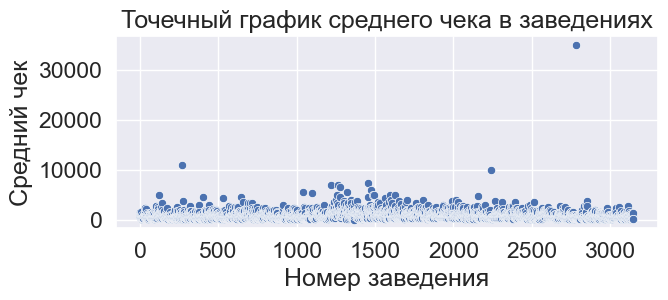

In [37]:
fig, ax = plt.subplots(figsize=(7, 2.5))
ax = sns.scatterplot(x=list(range(len(middle_avg_data))), y=middle_avg_data)
res = ax.set_title('Точечный график среднего чека в заведениях')
res = ax.set_xlabel('Номер заведения')
res = ax.set_ylabel('Средний чек')

Как можно увидеть, есть серьезные выбросы у заведений, средний чек, которых может достигать до 35000 рублей.

Отфильтруем 1% заведений среди числа записей с заполненными полями.

In [38]:
data = data[data.middle_avg_bill.isna() | data.middle_avg_bill <= 3750]

Проанализируем на пропуски значений. 

In [39]:
print('Количество непустых значений \'price\':', sum(~data.price.isna()))
print('Доля непустых значений \'price\': {:.1%}'.format(1 - data.price.isna().mean()))
print()
print('Количество непустых значений \'middle_avg_bill\':', sum(~data.middle_avg_bill.isna()))
print('Доля непустых значений \'middle_avg_bill\': {:.1%}'.format(1 - data.middle_avg_bill.isna().mean()))
print()
price_na_values = (~data.middle_avg_bill.isna() & ~data.price.isna())
print('Количество непустых значений \'price\' и \'middle_avg_bill\':', sum(price_na_values))
print('Доля непустых значений \'middle_avg_bill\': {:.1%}'.format(price_na_values.mean()))

Количество непустых значений 'price': 3315
Доля непустых значений 'price': 39.5%

Количество непустых значений 'middle_avg_bill': 3149
Доля непустых значений 'middle_avg_bill': 37.5%

Количество непустых значений 'price' и 'middle_avg_bill': 2679
Доля непустых значений 'middle_avg_bill': 31.9%


По цифрам видно, что ***только около 32%*** записей заполнены в обоих столбцах `price` и `middle_avg_bill`. Данные столбцы не являются ключевыми для исследования, поэтому мы не будем фильтровать строки с пустыми значениями.

Туперь изучим кореляцию `price` и `middle_avg_bill` для проверки соответствия `price`. Выведем квартили средних чеков по ценовым категориям и построим коробчатую диаграмму, чтобы показать распределение по ценовым категориям.

In [40]:
def quant(perc):
    return lambda x: x.dropna().quantile(perc)

price_perc = data.groupby('price').agg({'middle_avg_bill': [quant(0.25), quant(0.5), quant(0.75)]})
price_perc.columns = ['25%', '50%', '75%']
columns_my_order = ['низкие', 'средние', 'выше среднего', 'высокие']
price_perc = price_perc.reindex(columns_my_order)
price_perc.style.format('{:.0f}'.format).background_gradient(axis=None)

,25%,50%,75%
price,,,
низкие,150,180,250
средние,350,500,850
выше среднего,1250,1250,1500
высокие,1750,2000,2500


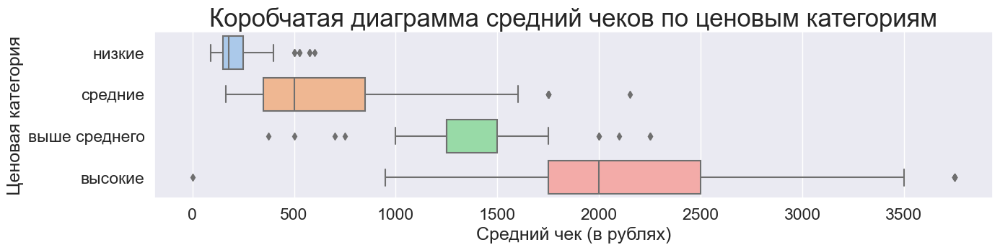

In [41]:
def quant(perc):
    return lambda x: x.dropna().quantile(perc)

fig, ax = plt.subplots(figsize=(15, 3))
columns_my_order = ['низкие', 'средние', 'выше среднего', 'высокие']
ax = sns.boxplot(data=data[data.middle_avg_bill <= 3750], order=columns_my_order, x="middle_avg_bill", y="price", palette=palette)
res = ax.set_title('Коробчатая диаграмма средний чеков по ценовым категориям', fontsize=25)
res = ax.set_xlabel('Средний чек (в рублях)')
res = ax.set_ylabel('Ценовая категория')

Как можно выдеть из таболички и графика, ценовая категория завеения хорошо кореллирует с средним чеком, несмотря на выбросы.

### Анализ количества посадочных мест


Посчитаем количество и долю заполненных значений в столбце.

In [42]:
print('Количество пустых записей поседочных мест: ', sum(data.seats.isna()))
print('Доля записей заведений с заполненным : {:.1%}'.format(1 - data.seats.isna().mean()))

Количество пустых записей поседочных мест:  3611
Доля записей заведений с заполненным : 57.0%


Заполнено ***57% записей*** в столбце `seats`.

Выведем точечечный график количества мест для всех заведений Москвы на предмет аномалий. Учтем, что количество поседочных мест заполнено только у меньше половиный заведений.


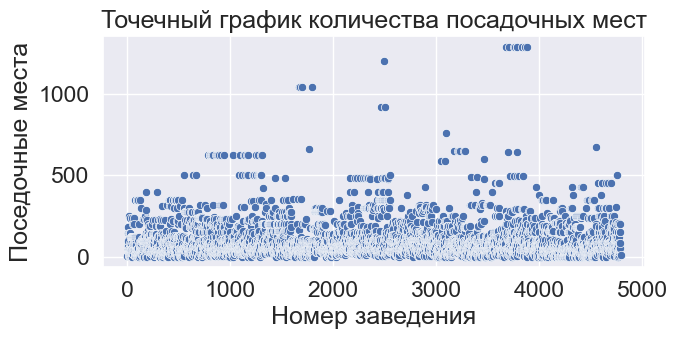

In [43]:
df_with_seats = data[~data.seats.isna()]
xvalues = list(range(len(df_with_seats.seats)))
fig, ax = plt.subplots(figsize=(7, 3))
ax = sns.scatterplot(data=df_with_seats, x=xvalues, y="seats")
res = ax.set_title("Точечный график количества посадочных мест")
res = ax.set_xlabel("Номер заведения") 
res = ax.set_ylabel("Поседочные места") 

Из графика можно увидеть, что в основном количество посадочных мест варьируется с отметки 0 до 250. Однако есть заведения с количество место 500 и более. Посчитаем 75-ю (3-я квартиль), 95-ю, 99-ю, 100-ю (максимум) перцентили.

In [44]:
np.percentile(df_with_seats.seats, [75, 95, 99, 100])

array([ 140.,  307.,  625., 1288.])

По перцентилям мы видим, что ***1 процент заведений имеют количество поседочных мест более 625 и может достигать до 1288***, в то время как три четверти заведений имеют количество мест менее 140. Отфильтруем этот 1 процент, чтоб посчитать среднее количество мест по категориям.

In [45]:
data = data[data.seats.isna() | data.seats <= 625]

### Общий вывод предобработки

В ходе предобработки данных было сделано следующее:
1. Проанализированы и обработаны дубликаты:
    - по всем строками датасета (не найдено);
    - совместно по столбцам `name` и `adress` и по `name`, `lat` и `lng` (с приведением столбца названия заведения в заголовочный регистр);
    - по столбцу `category` (не найдено отпечатков в строковых значениях);
    - по столбцу `district` (не найдено отпечатков в строковых значениях);
2. Проанализированы и обработаны пропуски:
    - в столбце `hours` (заполнены дефолным значением `неизвестно`);
    - в столбце `seats` (пропуски были оставлены значением `nan`).
3. Столбец `chain` был приведен в тип `bool`;
4. Создан столбец `street` из столбца `adress`;
5. Удалены аномальные заведения по среднему чеку `middle_avg_bill`;
5. Удалены аномальные заведения по количеству посадочных мест `seats`.

## Анализ данных

Проведем исследовательский анализ данных, в ходе которых изучим:
- <u>категории заведений</u>, распределение количество заведений по ним;
- <u>количество посадочных мест</u> в завдениях по категориям;
- <u>сетевые и несетевые заведения</u>, их соотношение, в том числе и по категориям;
- <u>топовые сети</u> Москвы по количеству заведений, их категории и общие признаки;
- <u>распределение заведений по административным районам</u> Москвы по общему количеству и по категориям;
- <u>средний рейтинг</u> заведений по категориям и административным районам;
- <u>топовые улицы</u> Москвы по количеству заведений, из категории;
- <u>улицы с одним общепитом</u>;
- <u>средний чек</u> заведений по категориям и районам Москвы.

### Категории заведения

Изучим категории заведений, какими они бывают, их распределение.

Выведем уникальных названия категорий.

In [46]:
categories = data.category.unique()
print(list(categories))

['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб', 'быстрое питание', 'булочная', 'столовая']


Мы обнаружили ***8 категорий*** заведений, различных по типу общепита.

Посчитаем количество заведений по категориям и построим графики их распределения и доли от общего числа.
Каждую категорию выделим отдельным цветом.

In [47]:
category_df = data.groupby('category', as_index=False) \
    .agg({'name': 'count'}).rename(columns={'name': 'count'}) \
    .sort_values(by='count', ascending=False) \
    .reset_index(drop=True)

Подготовим стиль графиков, которые будем строить.

In [48]:
category_colors = dict([(categories[i], palette[i]) for i in range(len(categories))])

In [49]:
def autolabel(ax, rects, shift):
    for rect in rects:
        width = rect.get_width()
        ax.text(width - shift, rect.get_y() + rect.get_height() / 2, int(width),
             ha='right', va='center', color='white')

/var/folders/dr/j4qk4lts0ng6yzjlrnb2qk5w0000gn/T/ipykernel_95378/240675731.py:2: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = plt.subplot(2, 1, 1)


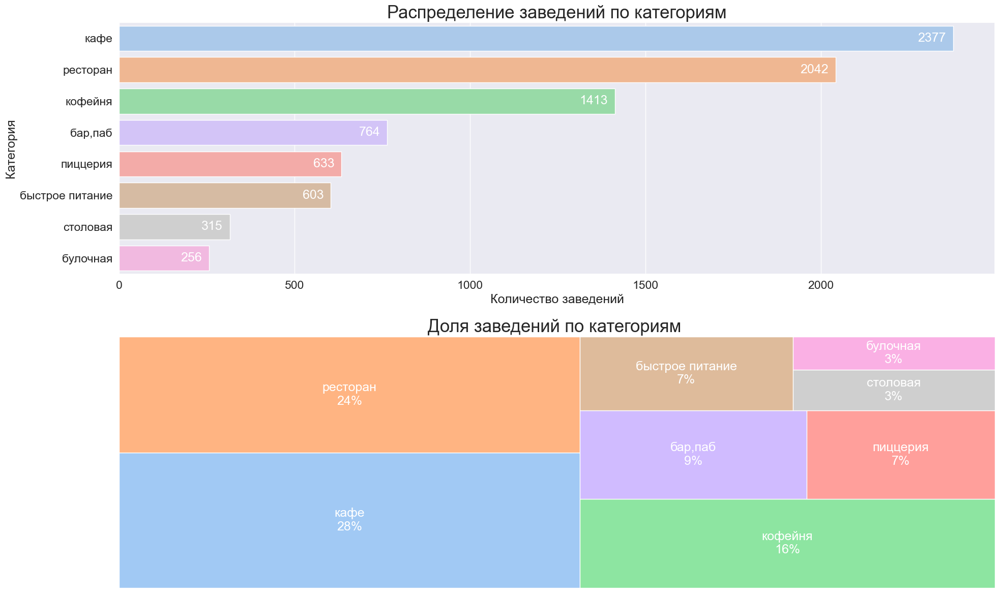

In [50]:
fig, ax = plt.subplots(figsize=(20, 12))
ax1 = plt.subplot(2, 1, 1)

sns.barplot(x="count", y="category", data=category_df, ax=ax1, palette=category_colors)
res = ax1.set_title("Распределение заведений по категориям", fontsize=25)
res = ax1.set_xlabel("Количество заведений") 
res = ax1.set_ylabel("Категория") 
autolabel(ax1, ax1.patches, 20)

ax2 = plt.subplot(2, 1, 2)
share = category_df['count'] / sum(category_df['count']) * 100
labels = [f'{x}\n{int(y)}%' for x, y in zip(category_df.category, share)]
colors = [category_colors[category] for category in category_df.category]

axis = squarify.plot(sizes=share, label=labels, color=colors, ax=ax2, text_kwargs={'fontsize': 18, 'color':'white'})
axis.set_title("Доля заведений по категориям ", fontsize=25)
plt.axis('off')
    
plt.tight_layout()
plt.show()

***Вывод:***
    
По построенным графикам можно сделать следующие выводы:
- наиболее популярными заведениями по категориям являются `кафе` (**2377** заведений), `рестораны` (**2042** заведений) и `кофейни` (**1413** заведений); общая доля этих категорий составляет ***69%***;
- наименее популярными - `столовые` (**315** заведений), `булочные` (**259** заведения);

### Количество посадочных мест по категориям

Изучим сначала общее распределение заведений по количеству посадочных мест.

In [51]:
df_with_seats = df_with_seats[df_with_seats.seats <= 625]
df_category_seats = df_with_seats.groupby('category', as_index=False) \
    .agg({'seats': 'mean'}) \
    .sort_values(by='seats', ascending=False)

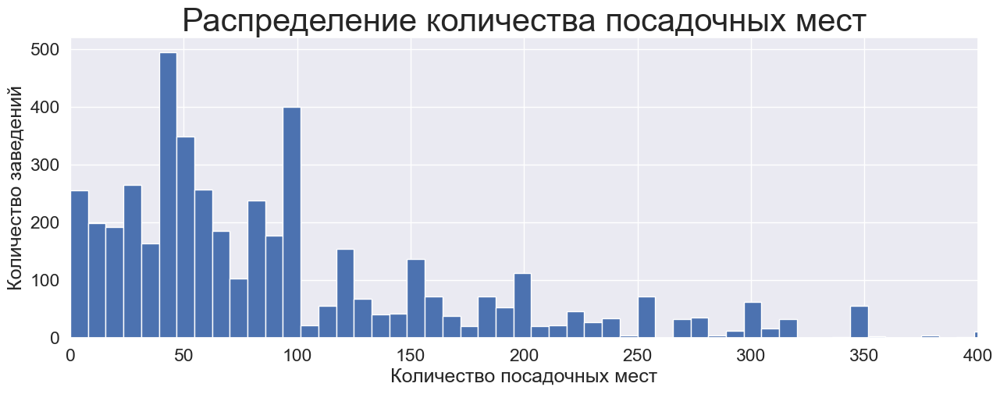

In [52]:
ax = df_with_seats.seats.hist(figsize=(15, 5), bins=80)
res = ax.set_xlim(0, 400)
res = ax.set_title('Распределение количества посадочных мест', fontsize=30)
res = ax.set_xlabel('Количество посадочных мест')
res = ax.set_ylabel('Количество заведений')

In [53]:
df_with_seats.seats.describe(percentiles=[i / 10 for i in range(1, 10, 1)]).to_frame().transpose()

,count,mean,std,min,10%,20%,30%,40%,50%,60%,70%,80%,90%,max
seats,4762.0,102.888912,99.544141,0.0,16.0,34.0,45.0,52.4,75.0,92.0,112.0,160.0,238.7,625.0


По графику и статистика количества посадочных мест можно сказать, что ***80% заведений*** имеют количества посадочных мест может варьироваться от **0 до 160**, но есть и большие выбросы.

Изучим теперь количество посадочных мест в заведениях по категориям.

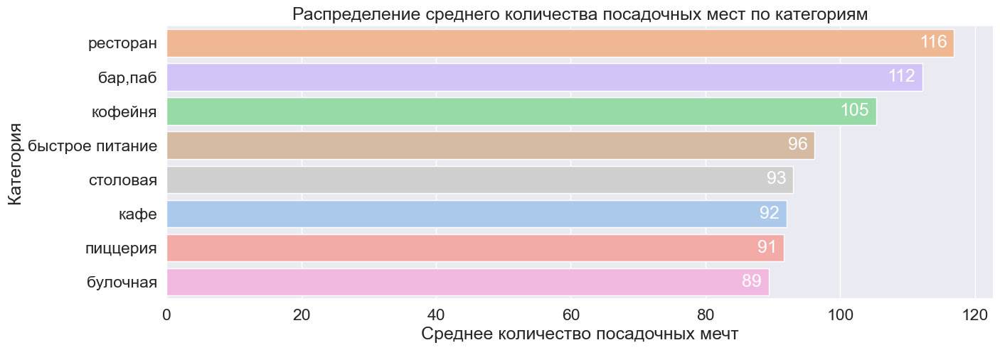

In [54]:
fig, ax = plt.subplots(figsize=(15, 5))
ax = sns.barplot(x=df_category_seats.seats, y=df_category_seats.category, ax=ax, palette=category_colors)
res = ax.set_title("Распределение среднего количества посадочных мест по категориям")
res = ax.set_xlabel("Среднее количество посадочных мечт") 
res = ax.set_ylabel("Категория") 
autolabel(ax, ax.patches, 1)

In [55]:
categories = data.category.unique()
fig = make_subplots(rows=1, cols=len(categories), shared_yaxes=True, subplot_titles=categories)

for index in range(len(categories)):
    c = categories[index]
    df = data[data.category == c]
    ax = fig.add_trace(
        go.Histogram(x=df.seats, name=c, marker_color=palette.as_hex()[index], xbins=dict(end=400), ybins=dict(end=250)), 
        1, 
        index + 1
    )

fig.update_layout(
    height=300, width=2000, 
    title_text="Соотнешение сетевых и несетевых заведений по отдельным категориям",
    title_x=0.1,
)
fig.show()

***Вывод:***

Количества посадочных мест можно сказать, что ***80% заведений*** имеют количества посадочных мест может варьироваться от **0 до 160**, но есть и большие выбросы.

По графику видно, что количество посадочных мест (в среднем от 100+) больше у `ресторанов`, `баров, пабов`и `кофейнях`. Среднее число других категорий варьируется в районе **89-96** заведений.

Данное распределение показывает какое нужно аркндовать или покупать коммерческую недвижимость под определеную категорию заведения.

### Принадлежость заведения к сети

Посчитаем для начала общее количество сетевых и несетевых заведений и их доли от общего числа.

In [56]:
is_chain_counts = data.chain.value_counts()

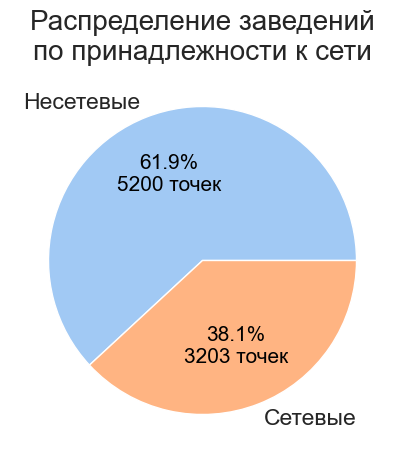

In [57]:
fig, ax = plt.subplots(figsize=(5, 5))
_, _, autotexts = plt.pie(
    is_chain_counts, 
    autopct= lambda p : f'{p:.1f}%\n{p*sum(is_chain_counts)/100 :.0f} точек', 
    labels=["Сетевые" if x else "Несетевые" for x in is_chain_counts.index], 
    colors=palette
)
ax.set_title("Распределение заведений\nпо принадлежности к сети", fontsize=20)

for text in autotexts:
    text.set_fontsize(15)
    text.set_color('black')

***Около 38 процентов*** заведений являются сетевыми.

Теперь узнаем какие категории чаще являются сетевыми. Построим столбчиковые диаграммы по каждой из них. 

In [58]:
df_cat_chains = data.groupby(['category', 'chain'], as_index=False).agg({'name': 'count'})
df_cat_chains.chain = df_cat_chains.chain.apply(lambda x: "Сетевой" if x else "Несетевой")
df_cat_chains.rename(columns={'name': 'count'}, inplace=True)
df_cat_chains.category = df_cat_chains.category.apply(lambda x: x.split(' ')[0])
df_categories = df_cat_chains.category.unique()

In [59]:
fig = make_subplots(rows=1, cols=8, shared_yaxes=True, subplot_titles=df_categories)


for index in range(len(df_categories)):
    c = df_categories[index]
    df = df_cat_chains[df_cat_chains.category == c]
    ax = fig.add_trace(
        go.Bar(x=df.chain, y=df['count'], name=c, text=df['count'], marker_color=palette.as_hex()[index]), 1, index + 1
    )

fig.update_layout(
    height=350, width=900, 
    title_text="Соотнешение сетевых и несетевых заведений по отдельным категориям",
    title_x=0.5
)
fig.show()

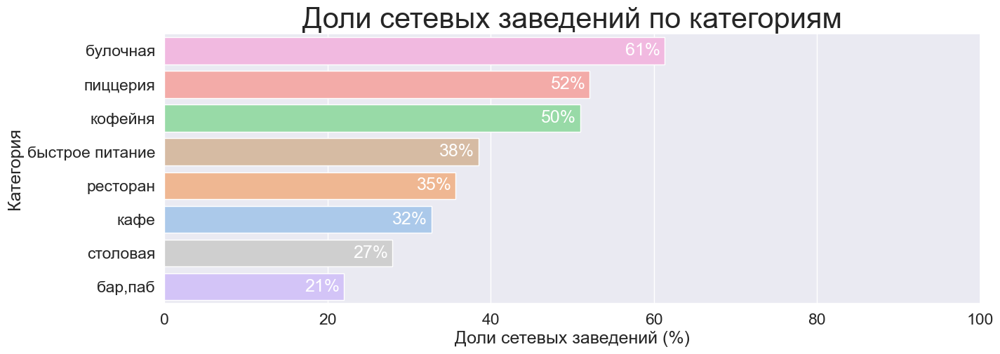

In [60]:
fig, ax = plt.subplots(figsize=(15, 5))
df_chains_by_category = data.groupby('category').chain.mean().sort_values(ascending=False) * 100
ax = sns.barplot(x=df_chains_by_category, y=df_chains_by_category.index, ax=ax, palette=category_colors)
res = ax.set_title("Доли сетевых заведений по категориям", fontsize=30)
res = ax.set_xlabel("Доли сетевых заведений (%)") 
res = ax.set_ylabel("Категория")
ax.set_xlim((0, 100))

for rect in ax.patches:
    width = rect.get_width()
    ax.text(width - 0.5, rect.get_y() + rect.get_height() / 2, f'{int(width)}%',
         ha='right', va='center', color='white')

***Вывод:***
    
Как можно видеть из графика:
- наиболее сетевыми по абсолютному количеству заведений являются `кафе`, `рестораны` и `кофейни`, что логично, поскольку именно эти категории востребованы в Москве и склонны разрастаться в сети;
- наиболее сетевыми по соотношению с несетевыми заведениями являются `кофейни`, `пицерии`, `булочные`. Вероятно, это может быть обусловлено меньшей необходимостью затратов и посадочных мест на одну точку (у `пицерии` и `булочной` наименьшее среднее количество мест).

### Топ-сети Москвы

Посчитаем топ 15 сетей Москвы и выведем количество точек, категорию заведений, районы, на которых распространена сеть и количество точек по ценовым категориям (без учета тех заведений, в которых не указаны ценовые категории). Также для наглядной демострации выведем столбчиковую диаграмму количества точек в этих сетях. 

In [61]:
df_top_names = (data[data.chain].groupby('name', as_index=False) 
    .agg({'name': 'first', 
          'category': 'first',
          'district': lambda x: len(x.dropna().unique()),
          'address': 'count'})
    .rename(columns={'address': 'count'})
    .sort_values(by='count', ascending=False)
    .reset_index(drop=True)
    .head(15))

df_chain_prices = pd.pivot_table(data[data.chain], index='name', columns='price', values='category', aggfunc='count', fill_value=0, margins=True)
df_chain_prices.sort_values(by='All', ascending=False).drop('All').reset_index().drop(['All'], axis=1)

df_top_names = df_top_names.join(df_chain_prices, on='name', how='left').fillna(0)
price_columns = ['высокие', 'выше среднего', 'низкие', 'средние']
price_dict = dict([(i, '{:.0f}'.format) for i in price_columns])
df_top_names.drop('All', axis=1).style \
    .background_gradient(subset=price_columns, axis=None).format(price_dict) \
    .background_gradient(subset=['count']) \
    .background_gradient(subset=['district'], cmap='YlGn')

,name,category,district,count,высокие,выше среднего,низкие,средние
0,Шоколадница,кофейня,9,120,0,2,1,49
1,Домино'С Пицца,пиццерия,9,76,0,0,1,38
2,Додо Пицца,пиццерия,9,74,0,0,0,8
3,One Price Coffee,кофейня,9,71,0,0,0,1
4,Яндекс Лавка,ресторан,9,69,0,0,0,0
5,Cofix,кофейня,9,65,0,0,4,3
6,Prime,ресторан,8,50,0,0,8,16
7,Хинкальная,быстрое питание,9,44,2,3,0,18
8,Кофепорт,кофейня,8,42,0,0,1,0
9,Кулинарная Лавка Братьев Караваевых,кафе,6,39,0,0,2,26


/var/folders/dr/j4qk4lts0ng6yzjlrnb2qk5w0000gn/T/ipykernel_95378/3081752822.py:17: MatplotlibDeprecationWarning:

The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.

/var/folders/dr/j4qk4lts0ng6yzjlrnb2qk5w0000gn/T/ipykernel_95378/3081752822.py:18: MatplotlibDeprecationWarning:

The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.

/var/folders/dr/j4qk4lts0ng6yzjlrnb2qk5w0000gn/T/ipykernel_95378/3081752822.py:19: MatplotlibDeprecationWarning:

The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.



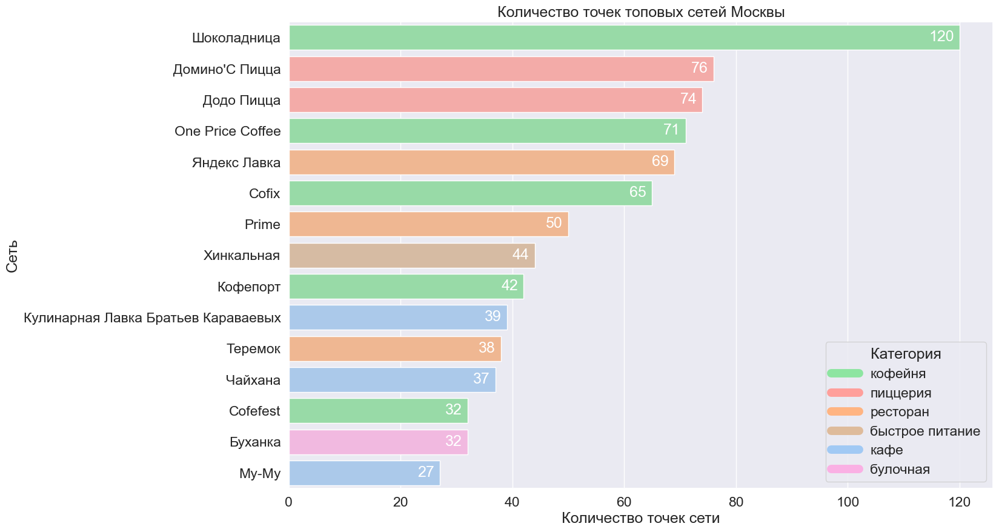

In [62]:
fig, ax = plt.subplots(figsize=(15, 10))

color = [category_colors[i] for i in df_top_names['category']]
top_categories = df_top_names.category.unique()
ax = sns.barplot(y=df_top_names['name'], x=df_top_names['count'], ax=ax, palette=color)
res = ax.set_title("Количество точек топовых сетей Москвы")
res = ax.set_xlabel("Количество точек сети") 
res = ax.set_ylabel("Сеть")

for rect in ax.patches:
    width = rect.get_width()
    ax.text(width - 1, rect.get_y() + rect.get_height() / 2, '{}'.format(int(width)),
         ha='right', va='center', color='white')


res = plt.legend(title='Категория', loc='lower right', labels=top_categories)
for i in range(len(res.legendHandles)):
    res.legendHandles[i].set_color(category_colors[top_categories[i]])
    res.legendHandles[i].set_linewidth(10)

Из графиков и данных таблицы можно увидеть, что в топ-сети попали известные на слух заведения, такие как `кофейни` как *Шоколадница, One Price Coffe, Cofix*, `пицерии` *Домино'c и Додо* и так далее. Единственное нужно отметить, что в статистику попала `Яндекс Лавка`, которая все же является отдельным типом заведения по доставке еды на дом.

Важнымы признаками, которые объединяют эти завдеения - это низкая или средняя ценовые категории этих сетей, а также распределение точек по всем административным районам Москвы (их всего 9).

***Выводы про самые популярные сети:***
- в основном распределены на все административные районы Москвы;
- категории: `кофейни`, `пицерии`, `рестораны` и `кафе`;
- в основом имеют `среднюю ценовую категорию`.

### Административные районы

Выведем все административные районы Москвы, которые присутствую в датасете.

In [63]:
list(data.district.unique())

['Северный административный округ',
 'Северо-Восточный административный округ',
 'Северо-Западный административный округ',
 'Западный административный округ',
 'Центральный административный округ',
 'Восточный административный округ',
 'Юго-Восточный административный округ',
 'Южный административный округ',
 'Юго-Западный административный округ']

Есть 9 административных районов, названных по географическому положению от центра города.

Выведем количество заведений по административным районам, а также с разбивкой на категории заведения.

In [64]:
district_counts = data.groupby('district', as_index=False).agg({'name': 'count'}) \
    .rename(columns={'name': 'count'}) \
    .sort_values(by='count', ascending=False) \
    .reset_index(drop=True)

In [65]:
columns = list(data.category.unique())
district_counts = pd.pivot_table(data, index='district', columns='category', values='name', aggfunc='count', margins=True) \
    .sort_values('All', ascending=False)  \
    .sort_values('All', ascending=False, axis=1) \
    .drop('All')
district_counts.style \
    .background_gradient(subset=columns, axis=None) \
    .background_gradient(subset=['All'], axis=0, cmap='gist_yarg')

category,All,кафе,ресторан,кофейня,"бар,паб",пиццерия,быстрое питание,столовая,булочная
district,,,,,,,,,
Центральный административный округ,2242,464,670,428,364,113,87,66,50
Северный административный округ,899,235,188,193,68,77,58,41,39
Южный административный округ,892,264,202,131,68,73,85,44,25
Северо-Восточный административный округ,890,269,182,159,62,68,82,40,28
Западный административный округ,850,238,218,150,50,71,62,24,37
Восточный административный округ,798,272,160,105,53,72,71,40,25
Юго-Восточный административный округ,714,282,145,89,38,55,67,25,13
Юго-Западный административный округ,709,238,168,96,38,64,61,17,27
Северо-Западный административный округ,409,115,109,62,23,40,30,18,12


По данным таблицы, мы видим, что в основном заведения в большей степени сконцентрированы в `Центральном административном округе` (2242 заведения в центре города при максимуме 900 заведений в отдельных других районах), причем в каждом категории, но в большей степени `кофейни`, `кафе`, `рестораны`,  являются итак востребоваными по всему городу, но также еще `бары, пабы`, которые в свою очередь сконцентрированы в большей степени только в центре.

Построим график распределения по районам с разбивкой на категории.

In [66]:
df_district_category = data.groupby(['district', 'category'], as_index=False) \
    .agg({'name': 'count'}) \
    .rename(columns={'name': 'count'}) \
    .sort_values(by='count')
df_district_category.district = df_district_category.district.apply(lambda x: x.split(' ')[0])

In [67]:
palette = sns.color_palette("pastel")

fig = px.bar(
    df_district_category,
    y="count", 
    x="district",
    text="count",
    color="category", 
    color_discrete_map=dict([(categories[i], palette.as_hex()[i]) for i in range(len(categories))]),
    title="Распределение заведений по категориям с разбивкой по принадлежности к сети",
)
fig.update_layout(
    xaxis=dict(title="Административный район"),
    yaxis=dict(title="Количество заведений"),
)
fig.show()

На графике можнго больше удостовериться в выводах, приведенных ранее.

***Вывод:***

Заведения в большей степени сконцентрированы в `Центральном административном округе` (2242 заведения в центре города при максимуме 900 заведений в отдельных других районах), причем в каждом категории, но в большей степени `кофейни`, `кафе`, `рестораны`,  являются итак востребоваными по всему городу.

`Бары, пабы` в большей степени сконцентрированы только в центре.

### Рейтинги заведений по категориям

Выведем средние рейтинги заведений по категориям. Также выведем средний рейтинг всех заведений.

In [68]:
fig = px.histogram(data, x='rating', title="Распределение средний оценов заведений")
fig.update_layout(
    xaxis=dict(title="Рейтинг"),
    yaxis=dict(title="Количество заведений"),
    title_x=0.5,
    height=400, width=900, 
)
fig.show()

In [69]:
data.rating.describe(percentiles=[i / 10 for i in range(10)]).to_frame().transpose().style.format('{:.2f}'.format)

,count,mean,std,min,0%,10%,20%,30%,40%,50%,60%,70%,80%,90%,max
rating,8403.00,4.23,0.47,1.00,1.00,3.80,4.10,4.20,4.20,4.30,4.40,4.40,4.50,4.70,5.00


По данным и графику распределения можно увидеть, что оценки раставляются от 1 до 5 баллов.

Оценики по гистограме распределены нормально ***со средним значением 4.23*** и ***среднеквадратичным отклонением 0.47***.

Средние оценки около ***80% заведений*** (с 10% до 90% перцентилей) распредены от ***3.8 до 4.7*** баллов.

In [70]:
df_rating = data.groupby('category', as_index=False).rating.mean().sort_values(by='rating', ascending=False)

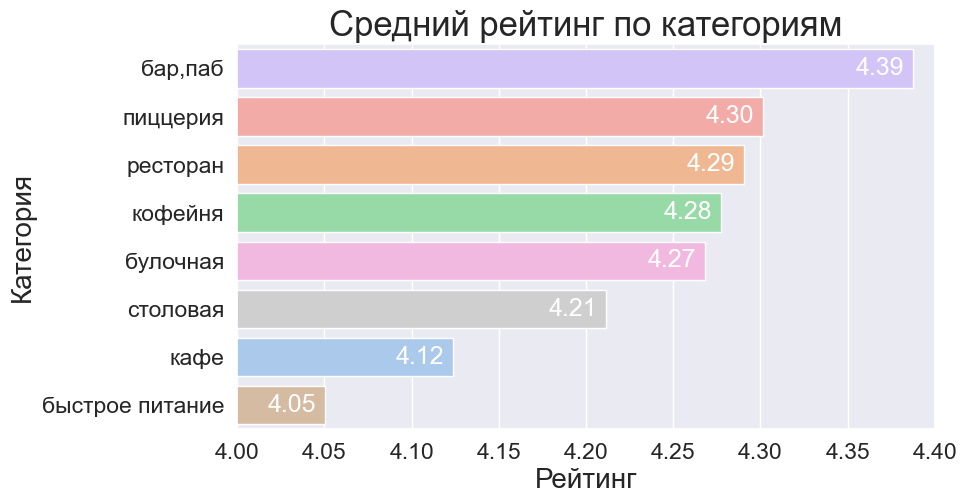

In [71]:
fig, ax = plt.subplots(figsize=(9, 5))
sns.barplot(x='rating', y='category', data=df_rating, ax=ax, palette=category_colors)
res = ax.set_title("Средний рейтинг по категориям", fontsize=25)
res = ax.set_xlabel("Рейтинг", fontsize=20) 
res = ax.set_ylabel("Категория", fontsize=20) 
res = ax.set_xlim((4, 4.4))

for rect in ax.patches:
    width = rect.get_width()
    ax.text(width - 0.005, rect.get_y() + rect.get_height() / 2, '{:.2f}'.format(width),
         ha='right', va='center', color='white')

In [72]:
categories = data.category.unique()
fig = make_subplots(rows=1, cols=len(categories), shared_yaxes=True, subplot_titles=df_categories)

for index in range(len(categories)):
    c = categories[index]
    df = data[data.category == c]
    ax = fig.add_trace(
        go.Histogram(x=df.rating, name=c, marker_color=palette.as_hex()[index], xbins=dict(end=400), ybins=dict(end=250)), 
        1, 
        index + 1
    )

fig.update_layout(
    height=300, width=2000, 
    title_text="Соотнешение сетевых и несетевых заведений по отдельным категориям",
    title_x=0.1,
)
fig.show()

In [73]:
percentiles = percentiles=[i / 10 for i in range(1, 10, 1)]
(data.groupby('category').rating.describe(percentiles=percentiles).sort_values(by='mean', ascending=False) 
    .style.format('{:.2f}'.format).format({'count': '{:.0f}'.format}) 
    .background_gradient(subset=[str(i) + '%' for i in range(10, 100, 10)], axis=None)
    .background_gradient(subset=['mean'], cmap='YlOrRd')
    .background_gradient(subset=['std'], cmap='YlOrBr')
)

,count,mean,std,min,10%,20%,30%,40%,50%,60%,70%,80%,90%,max
category,,,,,,,,,,,,,,
"бар,паб",764,4.387696,0.380392,1.100000,4.100000,4.300000,4.300000,4.400000,4.400000,4.500000,4.500000,4.600000,4.700000,5.000000
пиццерия,633,4.301264,0.336162,1.000000,4.100000,4.100000,4.200000,4.300000,4.300000,4.300000,4.400000,4.500000,4.700000,5.000000
ресторан,2042,4.290402,0.413143,1.000000,4.000000,4.100000,4.200000,4.300000,4.300000,4.400000,4.400000,4.500000,4.700000,5.000000
кофейня,1413,4.277282,0.372250,1.400000,4.000000,4.100000,4.200000,4.200000,4.300000,4.300000,4.400000,4.500000,4.700000,5.000000
булочная,256,4.268359,0.386303,1.300000,3.900000,4.100000,4.200000,4.300000,4.300000,4.400000,4.400000,4.500000,4.700000,5.000000
столовая,315,4.211429,0.454205,1.000000,3.800000,4.000000,4.100000,4.200000,4.300000,4.300000,4.400000,4.500000,4.600000,5.000000
кафе,2377,4.123896,0.566200,1.000000,3.500000,3.900000,4.000000,4.100000,4.200000,4.300000,4.400000,4.500000,4.700000,5.000000
быстрое питание,603,4.050249,0.560949,1.100000,3.400000,3.800000,4.000000,4.100000,4.200000,4.300000,4.300000,4.400000,4.500000,5.000000


***Вывод:***

Оценики по гистограме распределены нормально ***со средним значением 4.23*** и ***среднеквадратичным отклонением 0.47***.

Средние оценки около ***80% заведений*** (с 10% до 90% перцентилей) распредены от ***3.8 до 4.7*** баллов.

Наболее высокии оценки у `баров, пабов`, поскольку, вероятно, там больше ценится атмосфера, обслуживание, нежели в `кафе`, `столовых` и пунктов `быстрового питания`, где больше оценки ставят за качество еды.

При этом у категорий с низким средним рейтингом высокое значение среднего квадратичного отклонения, то есть есть большой разброс "хороших" и "плохих".

### Рейтинги заведений по административным районам

Теперь выведем средние рейтинги по районам.

In [74]:
district_ratings_df = data.groupby('district').rating.describe(percentiles=percentiles).sort_values(by='mean', ascending=False)
district_ratings_df.reset_index(drop=False, inplace=True)
column_forats = dict([(x, '{:.2f}'.format) for x in district_ratings_df.columns[1:]])
( 
    district_ratings_df.style.format(column_forats).format({'count': '{:.0f}'.format})
    .background_gradient(subset=[str(i) + '%' for i in range(10, 100, 10)], axis=None)
    .background_gradient(subset=['mean'], cmap='YlOrRd')
    .background_gradient(subset=['std'], cmap='YlOrBr')
)

,district,count,mean,std,min,10%,20%,30%,40%,50%,60%,70%,80%,90%,max
0,Центральный административный округ,2242,4.377520,0.281995,1.700000,4.100000,4.200000,4.300000,4.300000,4.400000,4.400000,4.500000,4.600000,4.700000,5.000000
1,Северный административный округ,899,4.239822,0.423390,1.300000,3.880000,4.000000,4.100000,4.200000,4.300000,4.300000,4.400000,4.500000,4.700000,5.000000
2,Северо-Западный административный округ,409,4.208802,0.473432,1.100000,3.800000,4.000000,4.200000,4.200000,4.300000,4.300000,4.400000,4.500000,4.620000,5.000000
3,Южный административный округ,892,4.184417,0.445168,1.100000,3.700000,4.000000,4.100000,4.200000,4.300000,4.300000,4.400000,4.400000,4.600000,5.000000
4,Западный административный округ,850,4.181647,0.520842,1.000000,3.800000,4.000000,4.100000,4.200000,4.300000,4.300000,4.400000,4.500000,4.600000,5.000000
5,Восточный административный округ,798,4.174185,0.479973,1.200000,3.700000,4.000000,4.100000,4.200000,4.300000,4.300000,4.400000,4.400000,4.700000,5.000000
6,Юго-Западный административный округ,709,4.172920,0.537887,1.000000,3.700000,4.000000,4.100000,4.200000,4.300000,4.300000,4.400000,4.400000,4.700000,5.000000
7,Северо-Восточный административный округ,890,4.147978,0.534166,1.000000,3.800000,4.000000,4.100000,4.200000,4.200000,4.300000,4.400000,4.400000,4.600000,5.000000
8,Юго-Восточный административный округ,714,4.101120,0.653182,1.000000,3.400000,3.860000,4.100000,4.100000,4.200000,4.300000,4.400000,4.500000,4.700000,5.000000


По цифрам снова видим, что `Центральный адимистративный округ` "выделяется" на фоне остальных. Средний рейтинг у них выше, чем в остальных районах.

Теперь построим карту, чтоб географически сравнить средние рейтинги заведений в между районами.

In [75]:
# загружаем JSON-файл с границами округов Москвы
state_geo = 'admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=9, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
fig = Choropleth(
    geo_data=state_geo,
    data=district_ratings_df,
    columns=['district', 'mean'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг'
).add_to(m)

title_html = f'<h4 style="position:absolute;z-index:10000;left:5vw" >Рейтинги заведений\n по административным районам</h4>'
m.get_root().html.add_child(Element(title_html))
# выводим карту
m

***Вывод:***

`Центральный адимистративный округ` "выделяется" на фоне остальных по среднему рейтингу заведений (`4.38`)

По карте более отчетливо видно, что в `Северном и Северо-западном административных районах` (средние оценки `4.24` и `4.2` соответсвенно), оценки ставят лучше, чем в других частях города.

Хуже всего оцениваются в `Юго-Восточном административном округе` (средний рейтинг - `4.1`).
Также можно наблюдать, что чем ниже средний рейтинг по району, тем выше разброс оценок (в `Юго-Восточном округе` **std** составляет **0.65** против **0.28** в `Центральном округе`). Это обусловлено тем, что выброс может быть только в меньшую сторону, так как сама по себе оценка ставиться до 5 баллов.

### Общая карта заведений Москвы

Построим теперь карту Москвы с добавление кластеров всех заведений.

По карте видно становится, что концентрация заведений в центральных и северных районах выше, чем в остальных.

In [76]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=9, tiles="Cartodb Positron")
marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

data.apply(create_clusters, axis=1)

title_html = f'<h4 style="position:absolute;z-index:10000;left:5vw" >Заведения общепита Москвы</h4>'
m.get_root().html.add_child(Element(title_html))
m

***Вывод:***
    
По кластерам видно, что большая концентрация заведений находится в `Центральном, Северном и Северо-Западном административных округах`.

### Топ улицы по количеству заведений

Сгруппируем заведения по улицам и выведем топ-15 по их поличеству.

In [77]:
street_count_df = (
    data.groupby('street', as_index=False)
        .agg({
            'name': 'count', 
            'rating': 'mean', 
            'category': lambda x: ', '.join(x.value_counts().sort_values(ascending=False).index)
        })
        .rename(columns={'name': 'count'})
        .sort_values(ascending=False, by='count')
)
(
    street_count_df[['street', 'count', 'rating']].head(15).style
        .format({'rating': '{:.2f}'.format})
        .background_gradient(subset=['count', 'rating'])
)

,street,count,rating
1090,проспект Мира,183,4.12
773,Профсоюзная улица,122,4.19
1087,проспект Вернадского,108,4.22
525,Ленинский проспект,107,4.21
523,Ленинградский проспект,95,4.29
373,Дмитровское шоссе,88,4.15
455,Каширское шоссе,77,4.14
298,Варшавское шоссе,76,4.20
524,Ленинградское шоссе,70,4.17
550,МКАД,65,4.12


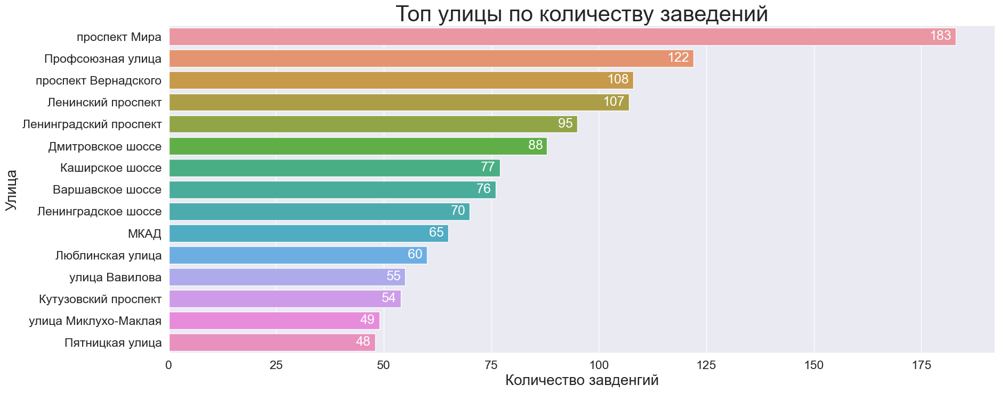

In [78]:
fig, ax = plt.subplots(figsize=(20, 8))
sns.barplot(x="count", y="street", data=street_count_df.head(15), ax=ax)
res = ax.set_title("Топ улицы по количеству заведений", fontsize=30)
res = ax.set_xlabel("Количество завденгий", fontsize=20) 
res = ax.set_ylabel("Улица", fontsize=20) 

for rect in ax.patches:
    width = rect.get_width()
    ax.text(width - 1, rect.get_y() + rect.get_height() / 2, '{:.0f}'.format(width),
         ha='right', va='center', color='white')

Также для разнообразия выделим 10-самых популярные улицы по среднему рейтингу, где есть как минимум 5 заведений.

In [79]:
(
    street_count_df[street_count_df['count'] > 5]
        .sort_values(by='rating', ascending=False)
        .head(10)
        .style
        .format({'rating': '{:.2f}'.format})
        .background_gradient(subset=['count', 'rating'])
)

,street,count,rating,category
172,Амурская улица,9,4.61,"пиццерия, кофейня, ресторан, бар,паб, кафе"
1395,улица Сретенка,15,4.61,"ресторан, бар,паб, кафе, кофейня, быстрое питание"
1394,улица Спиридоновка,6,4.60,"ресторан, бар,паб, кафе"
377,Долгоруковская улица,6,4.58,"бар,паб, кофейня, кафе"
933,Трубная улица,6,4.58,"бар,паб, кафе"
503,Кривоколенный переулок,9,4.58,"бар,паб, кафе, быстрое питание, кофейня"
1278,улица Малая Дмитровка,7,4.57,"кафе, бар,паб, ресторан"
970,Цветной бульвар,7,4.57,"ресторан, пиццерия, бар,паб, быстрое питание"
216,Благовещенский переулок,6,4.57,"бар,паб, ресторан, кафе, кофейня"
806,Садовая-Черногрязская улица,6,4.57,"ресторан, бар,паб, кофейня"


Как можем увидеть по графику, что естественно самые шоссе, проспекты и МКАД имеют большие количества заведений, поскольку они сами по себе длинные и имеют большое количество домов.

***Вывод:***

Больше всего заведений находится на `проспекте Мира`, `Профсоюзной улице`, `проспекте Вернадского`, `Ленинградском проспекте`. И на одной улице может находится до 183 заведений.

Самые популярные улицы по среднему рейтингу заведений с +5 точек - Амурская улица

Средние рейтинги этих за

### Улицы с одним заведением

Посчитаем долю улиц, на которых находится ровно одно заведение и долю заведений, которые находятся на 1 улице.

In [80]:
print('Доля улиц с одним заведением: {:.1%}'.format((street_count_df['count'] == 1).mean()))
one_streets = street_count_df[street_count_df['count'] == 1].street
print('Доля заведений, находящихся на одной улице: {:.1%}'.format(sum(data.street.isin(one_streets)) / len(data.street)))

Доля улиц с одним заведением: 31.6%
Доля заведений, находящихся на одной улице: 5.5%


Теперь посчитаем долю заведений на одной улице с разбивкой по категориям.

In [81]:
one_streets = street_count_df[street_count_df['count'] == 1].street
data['is_one_street'] = data.street.isin(one_streets)
os_data = data[data['is_one_street']] 

In [82]:
os_categories = os_data.groupby('category').agg({'name': 'count'})
os_categories = os_categories.rename(columns={'name': 'os_count'})
os_count_sum = os_categories['os_count'].sum()
os_categories['overall_share'] = os_categories['os_count'] / os_count_sum
os_categories['category_share'] = os_categories['os_count'] / data.category.value_counts()
os_categories = os_categories.sort_values(by='overall_share', ascending=False)
os_categories.style.format({'overall_share': '{:.1%}'.format, 'category_share': '{:.1%}'.format}).background_gradient(subset=['category_share', 'overall_share'])

,os_count,overall_share,category_share
category,,,
кафе,160,34.9%,6.7%
ресторан,93,20.3%,4.6%
кофейня,84,18.3%,5.9%
"бар,паб",39,8.5%,5.1%
столовая,36,7.9%,11.4%
быстрое питание,23,5.0%,3.8%
пиццерия,15,3.3%,2.4%
булочная,8,1.7%,3.1%


Как мы видим, что `столовые` наиболее чаще находятся на одиноких улицах, чем другие категории.

Выведем теперь средние рейтинги по категориям с разбивкой на тип улицы (с 1 заведением и 2+).

In [83]:
df_os = pd.pivot_table(data, index='category', columns='is_one_street', values='rating', aggfunc='mean')
df_os.columns = ['not_alone', 'alone']
df_os['diff_alone'] = df_os['alone'] - df_os['not_alone']
df_os.sort_values(by='diff_alone', ascending=False).style.format('{:.2f}').background_gradient(subset=['diff_alone'])

,not_alone,alone,diff_alone
category,,,
"бар,паб",4.38,4.48,0.10
пиццерия,4.30,4.37,0.07
булочная,4.27,4.34,0.07
столовая,4.21,4.26,0.06
быстрое питание,4.05,4.08,0.03
кофейня,4.28,4.31,0.03
кафе,4.12,4.13,0.01
ресторан,4.29,4.25,-0.05


Как мы видим, что только `ресторанов` рейтинг заведений на "одиноких" улицах ниже, чем на улицах, где есть еще хоть одно заведение. В остальных случаях средний рейтинг  "одиноких"  заведенией выше.

***Вывод:***

По данным мы видим, среди заведений, которые не имеют конкурентов на той же улице, больше всего встречается `кафе`,  а также `кофейни` и `рестораны`. Однако если рассматривать категории по отдельности, то большая доля заведений на "одиноких" улицах у `столовых`. Это обусловлено тем, что `столовые` хуже выдерживают конкуренцию рядом с другими типами заведений и скорее всего они находятся около офисных сданий или внутри.

По рейтингу кроме `ресторанов` рейтинги у заведений на "одиноких" улицах выше.

### Средний чек по административным районам

Выведем медианный средний чек по административным районам.

In [84]:
district_middle_avg_df = data.groupby('district', as_index=False).agg({'middle_avg_bill': 'median'})
district_middle_avg_df.sort_values(by='middle_avg_bill', ascending=False).reset_index(drop=True) \
    .style.background_gradient(subset='middle_avg_bill').format({'middle_avg_bill': '{:.0f}'.format})

,district,middle_avg_bill
0,Западный административный округ,1000
1,Центральный административный округ,1000
2,Северо-Западный административный округ,700
3,Северный административный округ,650
4,Юго-Западный административный округ,600
5,Восточный административный округ,575
6,Северо-Восточный административный округ,500
7,Южный административный округ,500
8,Юго-Восточный административный округ,450


Выведем теперь эту информацию на карту, чтобы посмотреть географическое распределение.

In [85]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

Choropleth(
    geo_data=state_geo,
    data=district_middle_avg_df,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный средний чек',
).add_to(m)
title_html = f'<h4 style="position:absolute;z-index:10000;left:5vw">Медианный средний чек заведений по районам</h4>'
m.get_root().html.add_child(Element(title_html))
m

***Вывод:***

По карте видно, что средний чек в основном высокий у `Центрального и Западного` административных районов.

Самые низкие цены находтся в `Южном, Юго-Восточном и Северо-Восточном` административных районов.

### Часы работы заведений

Проанализируем тогда часы работы заведений, как и в общем для всех заведений, так и с разбивкой по категориям и часам работы.

Напишем функцию, которая будем парсить значения колонку `hours` и возвращать матрицу с заполненными единицами по дням недели и часам.

In [86]:
wd = ['пн', 'вт', 'ср', 'чт', 'пт', 'сб', 'вс']

def display_hours(hours):
    if hours == 'неизвестно':
        return np.matrix([[0] * 24] * 7)
    if hours == 'ежедневно, круглосуточно':
        return np.matrix([[1] * 24] * 7)

    week_hours = [[0] * 24] * 7
    if hours.startswith('ежедневно'):
        time = re.findall(r'ежедневно, (\d{2}):\d{2}–(\d{2}):\d{2}', hours)[0]
        hstart, hend = int(time[0]), int(time[1])
        if hstart < hend:
            return np.matrix([[1 if h >= hstart and h < hend else 0 for h in range(24)]] * 7)
        else:
            return np.matrix([[1 if h >= hstart or h < hend else 0 for h in range(24)]] * 7)
         
    else:
        hlist = list(map(lambda x: x.strip(), hours.split(';')))
        week_hours = [[0] * 24] * 7
        for hour in hlist:
            days, hstart, hend = [], 0, 0
            if re.match(r'[а-я]{2}-[a-я]{2} \d{2}:\d{2}–\d{2}:\d{2}', hour):
                time = re.findall(r'([а-я]{2})-([a-я]{2}) (\d{2}):\d{2}–(\d{2}):\d{2}', hour)[0]
                wstart, wend, hstart, hend  = wd.index(time[0]), wd.index(time[1]), int(time[2]), int(time[3])
                days = list(range(wstart, wend + 1))
            elif re.match(r'[a-я,]* \d{2}:\d{2}–\d{2}:\d{2}', hour):
                time = re.findall(r'([a-я,]*) (\d{2}):\d{2}–(\d{2}):\d{2}', hour)[0]
                days, hstart, hend = list(map(lambda x: wd.index(x), time[0].split(','))), int(time[1]), int(time[2])
            for day in days:
                if hstart < hend:
                    week_hours[day] = [1 if h >= hstart and h < hend else 0 for h in range(24)]
                else:
                    week_hours[day] = [1 if h >= hstart or h < hend else 0 for h in range(24)]
    return np.matrix(week_hours)

Построим теперь интерактивную датасет с выбором категории и административного района по количеству заведений, которые работают в определенные чам и день недели.

In [87]:
vse = 'Все'
categories = [vse, *data.category.unique()]
districts = [vse, *data.district.unique()]

@interact
def show_articles_more_than(category=categories, district=districts, ratio=['число заведений', 'процент заведений']):
    df = data if (category == vse) else data[data.category == category]
    df = df if (district == vse) else df[df.district == district]
    
    count = len(df.name)
    print('Число заведений: ', count)
    hours = np.array(df.hours.apply(lambda x: np.matrix(display_hours(x))).to_list())
    counts_sum = hours.sum(axis=0)
    if ratio == 'процент заведений':
        counts_sum = counts_sum.astype(np.float32) / count
        format_ = '{:.0%}'.format
    else:
        format_ = '{:.0f}'.format
    df_hours = pd.DataFrame(index=wd, data=counts_sum)
    return df_hours.style.background_gradient(axis=None).format(format_)

interactive(children=(Dropdown(description='category', options=('Все', 'кафе', 'ресторан', 'кофейня', 'пиццери…

***Вывод:***

По данным датасетов можно сделать следующие выводы:
- более 90% заведений в основном работают с **пн-пт с 12 до 17 часов включительно**;
- более 80% заведений в основном работают **ежедневно с 11 (с 12 по выходным) до 19 часов**; 
- в ночное время работают онколо 10-13% заведений **ежедневно**;

Есть также интересные особенности (часы работы, зависимость от дня недели и другие) по отдельным категориям в табличном формате:


| Категория | Основне часы | Зависимость от дня недели | Особенности |
| :- | :- | :- | :- |
| кафе | 10-23 | в выходные открыто примерно на **10%** меньше заведений |  в пт-сб 11% заведений работают до 2-х ночи  |
| кофейни | 8-23 | в выходные открыто примерно на **12%** меньше заведений | Низкие 4-5% кофеен работают в ночное время |
| рестораны | 10-23 | в выходные открыто примерно на **5%** меньше заведений  | в пт-сб 16% заведений работают до 2-х ночи |
| бары, пабы | 12-24 | одинаково | в пт-сб 40% заведений работают до 2-х ночи |
| пиццерии | 10-23 | в выходные открыто примерно на **4%** меньше заведений | |
| быстрое питание | 10-22 | в выходные открыто примерно на **4%** меньше заведений | 25% заведений работают в ночное время |
| булочные | 8-22 | в выходные открыто примерно на **4%** меньше заведений | |
| столовые | 10-18 | по будням, в сб работают **30%** заведений, в вс - **24%** |Низкие 4-5% столовых работают в ночное время |


### Круглосуточные заведения

Посчитаем теперь круглосуточные заведения.

Для начала посчитаем общее их число и долю.

In [88]:
print('Количество круглосуточных заведений:', sum(data['is_24_7']))
print('Доля круглосуточных заведений: {:.1%}'.format(data['is_24_7'].fillna(0).mean()))

Количество круглосуточных заведений: 730
Доля круглосуточных заведений: 8.7%


Найдено ***730 (8.7% от общего числа)*** круглосуточных заведений.

Теперь посчитаем тоже самое, но с разбикой на категории.

In [89]:
df_24 = data.groupby('category').agg({'is_24_7': ['sum', 'mean']})
df_24.columns = ['count', 'share']
df_24.sort_values(by='share', ascending=False, inplace=True)
df_24.style.format({'share': '{:.1%}'.format}).background_gradient()

,count,share
category,,
быстрое питание,150,24.9%
кафе,267,11.2%
булочная,24,9.4%
"бар,паб",52,6.8%
ресторан,135,6.6%
пиццерия,31,4.9%
кофейня,59,4.2%
столовая,12,3.8%


***Вывод:***

По абсолютнолному количеству больше всего круглосуточных игр приходится на `кафе` (267).

Если смотреть отдельно по каждым категориям, то чаще всего круглосуточными встречаются заведения `быстрого питания` (около четверти 24.9%).

### Общий вывод анализа данных

В ходе анализа данных были сделаны следующие выводы:

I. Категории заведений
- Наиболее популярными заведениями по категориям являются `кафе` (**2377** заведений), `рестораны` (**2042** заведений) и `кофейни` (**1413** заведений); общая доля этих категорий составляет ***69%***;
- Наименее популярными - `столовые` (**315** заведений), `булочные` (**259** заведения);<br>

II. Посадочные места по категориям
- У ***80% заведений*** количество посадочных мест может варьироваться от **0 до 160**, но есть и большие выбросы.
- Количество посадочных мест (в среднем от 100+) больше у `ресторанов`, `баров, пабов`и `кофейнях`. Среднее число других категорий варьируется в районе **89-96** заведений.
- Данное распределение показывает какое нужно арендовать или покупать коммерческую недвижимость под определеную категорию заведения.

III. Сетевые и несетевые заведения
- Наиболее сетевыми по абсолютному количеству заведений являются `кафе`, `рестораны` и `кофейни`, что логично, поскольку именно эти категории востребованы в Москве и склонны разрастаться в сети;
- Наиболее сетевыми по соотношению с несетевыми заведениями являются `кофейни`, `пицерии`, `булочные`. Вероятно, это может быть обусловлено меньшей необходимостью затратов и посадочных мест на одну точку (у `пицерии` и `булочной` наименьшее среднее количество мест среди других категорий).

IV. Топ-сети Москвы
- точки в основном распределены на все административные районы Москвы;
- основные категории топ-сетей: `кофейни`, `пицерии`, `рестораны` и `кафе`;
- топ-сети в основом имеют `среднюю ценовую категорию`;
- самая популярная сеть по количеству точек - `кафе` **Шоколадница**.

V. Административные районы
- Было обнаружено 9 аминистративных районах Москвы, названия которых обозначают географичествое положение отностительно центра Москвы;
- Заведения в большей степени сконцентрированы в `Центральном административном округе` (2242 заведений в центре города на контрасте со втором по количеству Северном административном районе - 899 заведений), причем количество заведений в центре превосходят по количеству по каждой категории, но в большей степени `кофейни`, `кафе`, `рестораны`,  являются итак востребоваными по всему городу.
- `Бары, пабы` в большей степени сконцентрированы только в центре относительно других административных районах.

VI. Рейтинги заведений
- Средние оценки заведений распределены нормально ***со средним значением 4.23*** и ***среднеквадратичным отклонением 0.47***;
- Средние оценки около ***80% заведений*** (с 10% до 90% перцентилей) распредены от ***3.8 до 4.7*** баллов.
- Наболее высокии оценки у `баров, пабов`, поскольку, вероятно, там больше ценится атмосфера, обслуживание, нежели в `кафе`, `столовых` и пунктов `быстрового питания`, где больше оценки ставят за качество еды.
- У категорий (`кафе`, `столовых` и пунктов `быстрового питания`) с низким средним рейтингом есть высокие значения среднего квадратичного отклонения, то есть есть большой разброс "хороших" и "плохих" заведений.

VII. Рейтинги заведений по административным районам
- `Центральный адимистративный округ` "выделяется" на фоне остальных по среднему рейтингу заведений (`4.38`);
- `Северном и Северо-западном административных районах` (средние оценки `4.24` и `4.2` соответсвенно), оценки ставят лучше, чем в других частях города;
- Хуже всего оцениваются в `Юго-Восточном административном округе` (средний рейтинг - `4.1`).
- Чем ниже средний рейтинг по району, тем выше разброс оценок (в `Юго-Восточном округе` **std** составляет **0.65** против **0.28** в `Центральном округе`); это обусловлено тем, что выброс может быть только в меньшую сторону, так как сама по себе оценка ставиться до 5 баллов.

## Открытие кофейни

Делаем теперь анализ рынка под открытие кофейни для основателей фонда «Shut Up and Take My Money». Заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно.

Проведем анализ рынка и выведем основные моменты, которые необходимо учесть заказчикам.

### Общая информация о кофейнях Москвы

Выведем в отдельную переменную все записи о кофейнях.

In [90]:
df_coffeeshop = data[data['category'] == 'кофейня']

In [91]:
df_coffeeshop.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7,is_one_street
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,False,NaN,улица Маршала Федоренко,False,False
25,В Парке Вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,True,NaN,парк Левобережный,False,True
45,9 Bar Coffee,кофейня,"Москва, Коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,NaN,NaN,NaN,NaN,True,46.0,Коровинское шоссе,False,False
46,Cofefest,кофейня,"Москва, улица Маршала Федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,NaN,NaN,NaN,True,NaN,улица Маршала Федоренко,False,False
52,Cofix,кофейня,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,NaN,NaN,NaN,NaN,True,NaN,улица Дыбенко,False,False


Посчитаем общее количество кофеен в городе.

In [92]:
print('Количество кофеен в Москве:', len(df_coffeeshop.name))

Количество кофеен в Москве: 1413


Посмотрим теперь распределение заведений по административным районам.

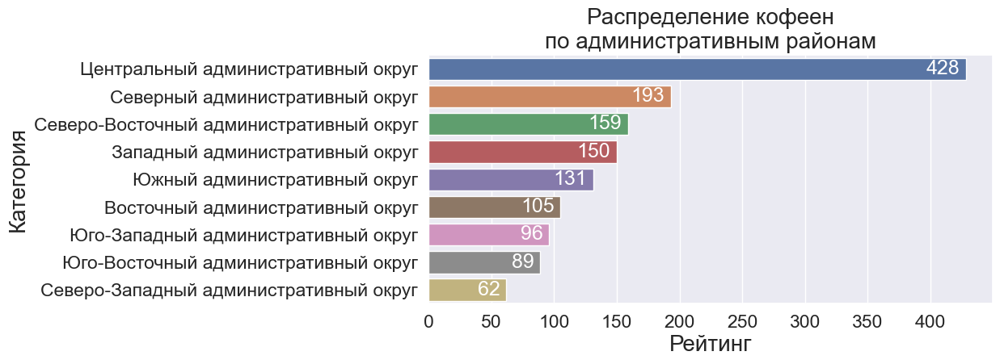

In [93]:
fig, ax = plt.subplots(figsize=(9, 4))
df_districts_coffeeshops = df_coffeeshop.groupby('district', as_index=False).agg({'name': 'count'}).rename(columns={'name': 'counts'})
df_districts_coffeeshops.sort_values(ascending=False, by='counts', inplace=True)
sns.barplot(x='counts', y='district', data=df_districts_coffeeshops, ax=ax)
res = ax.set_title("Распределение кофеен\nпо административным районам", fontsize=20)
res = ax.set_xlabel("Рейтинг", fontsize=20) 
res = ax.set_ylabel("Категория", fontsize=20)
for rect in ax.patches:
    width = rect.get_width()
    ax.text(width - 5, rect.get_y() + rect.get_height() / 2, '{:.0f}'.format(width),
         ha='right', va='center', color='white')

Посчитаем теперь доли от общего числа.

In [94]:
df_districts_coffeeshops['share'] = df_districts_coffeeshops['counts'] / len(df_coffeeshop['name'])
df_districts_coffeeshops.style.format({'share': '{:.2%}'.format}).background_gradient(subset=['counts', 'share'])

,district,counts,share
5,Центральный административный округ,428,30.29%
2,Северный административный округ,193,13.66%
3,Северо-Восточный административный округ,159,11.25%
1,Западный административный округ,150,10.62%
8,Южный административный округ,131,9.27%
0,Восточный административный округ,105,7.43%
7,Юго-Западный административный округ,96,6.79%
6,Юго-Восточный административный округ,89,6.30%
4,Северо-Западный административный округ,62,4.39%


Покажем на карте для наглядности.

In [95]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

Choropleth(
    geo_data=state_geo,
    data=df_districts_coffeeshops,
    columns=['district', 'counts'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный средний чек',
).add_to(m)
title_html = f'<h4 style="position:absolute;z-index:10000;left:5vw">Количество кафеен по административным районам</h4>'
m.get_root().html.add_child(Element(title_html))
m

***Вывод:***
- Всего кофеен в Москве - ***1413***;
- Около ***30% кофеен*** находятся `Центральном` адимистративном округе (**428** точек);
- Следом по количеству идут `Северный` административный округ (***193*** заведений - ***13.66%*** от общего числа) и `Северо-Восточный` административный округ (***159*** заведений - ***11.25%*** от общего числа);
- Минимальное количество кофеен находятся в `Северо-Западном` административном округе.

### Часы работы и круглосуточные кофейни

Теперь посмотрим на часы работы кофеен и есть ли круглосуточные кофейни. 

Для начала посчитаем их количество и долю от числа тех, где есть информация о часах работы.

In [96]:
print('Количество круглосуточных кофеен: ', sum(df_coffeeshop.is_24_7))
print('Доля круглосуточных кофеен (среди указанных): {:.2%}'.format(df_coffeeshop.is_24_7.mean()))
print('Доля круглосуточных кофеен (среди указанных): {:.2%}'.format(sum(df_coffeeshop.is_24_7) / len(data.is_24_7)))

Количество круглосуточных кофеен:  59
Доля круглосуточных кофеен (среди указанных): 4.18%
Доля круглосуточных кофеен (среди указанных): 0.70%


Всего найдено 59 указанных круглосуточных кофеен, что неочень большая доля от общего числа. 

Соответственно при открытии кофейни надо посмотреть какие часы работы приемлемы для кофейни.

In [97]:
vse = 'Все'
districts = [vse, *data.district.unique()]

@interact
def show_articles_more_than(district=districts, ratio=['число заведений', 'процент заведений']):
    df = df_coffeeshop if (district == vse) else df_coffeeshop[df_coffeeshop.district == district]
    
    count = len(df.name)
    print('Общее число кофеен:', count)
    hours = np.array(df.hours.apply(lambda x: np.matrix(display_hours(x))).to_list())
    counts_sum = hours.sum(axis=0)
    if ratio == 'процент заведений':
        counts_sum = counts_sum.astype(np.float32) / count
        format_ = '{:.0%}'.format
    else:
        format_ = '{:.0f}'.format
    df_hours = pd.DataFrame(index=wd, data=counts_sum)
    return df_hours.style.background_gradient(axis=None).format(format_)

interactive(children=(Dropdown(description='district', options=('Все', 'Северный административный округ', 'Сев…

***Вывод:***

Как видим из данных рекомендуем следующие часы работы:
- обязательные часы работы кофейни - ***с 10 до 18 часов***;
- по будням можно расширить часы - ***с 8 до 22 часов***;
- по выходным можно расширить часы - ***с 9 до 22 часов***;
- в ночное время не рекомендуется работать (около  ***4-5%*** ночных кофеен);
- часы работы кофеен не зависят от района города;

### Рейтинги кофеен

Посчитаем теперь рейтинги кофеен и их зависимость от административного района.

Выведем для начала общую информацию по кофейням.

In [98]:
df_stats = df_coffeeshop.rating.describe().to_frame().transpose()
df_stats.style.format('{:.2f}'.format).format({'count': '{:.0f}'.format})

,count,mean,std,min,25%,50%,75%,max
rating,1413,4.277282,0.372250,1.400000,4.100000,4.300000,4.400000,5.000000


In [99]:
mean = df_stats['mean']
std = df_stats['std']
std_perc = stats.percentileofscore(df_coffeeshop.rating, [mean - std, mean + std])
std2_perc = stats.percentileofscore(df_coffeeshop.rating, [mean - 2 * std, mean + 2 * std])
std3_perc = stats.percentileofscore(df_coffeeshop.rating, [mean - 3 *  std, mean + 4 * std])
print('Доля заведений, которые по рейтингу отклоняются от среднего менее чем на:')
print('- 1 среднеквадратичное отклонение {:.2f}%;'.format((std_perc[1] - std_perc[0])[0]))
print('- 2 среднеквадратичных отклонения {:.2f}%;'.format((std2_perc[1] - std2_perc[0])[0]))
print('- 3 среднеквадратичных отклонения {:.2f}%.'.format((std3_perc[1] - std3_perc[0])[0]))

Доля заведений, которые по рейтингу отклоняются от среднего менее чем на:
- 1 среднеквадратичное отклонение 77.49%;
- 2 среднеквадратичных отклонения 96.53%;
- 3 среднеквадратичных отклонения 98.23%.


In [100]:
c = categories[index]
fig = px.histogram(x=df_coffeeshop.rating, nbins=50) 
fig.update_layout(
    height=300, width=800, 
    xaxis=dict(title="Рейтинг"),
    yaxis=dict(title="Количество заведений"),
    title_text="Рассперделение кофеен по рейтингу",
    title_x=0.5,
)
fig.show()

В целом мы видим нормальное распределение кофеен по рейтингу, где значение медиана **4.3** близко к среднему значению **4.28**.
Средне квадратичное отклонение равно **0.37**, соответсвенно мы можем сказать, что рейтинг варьируется от ***3.9 до 4.7*** (с учетом округления 0.37 до 0.4).

Теперь посчитаем рейтинги по административным районам.



In [101]:
district_coffeshop_ratings_df = df_coffeeshop.groupby('district').rating.describe(percentiles=percentiles).sort_values(by='mean', ascending=False)
district_coffeshop_ratings_df.reset_index(drop=False, inplace=True)
column_forats = dict([(x, '{:.2f}'.format) for x in district_coffeshop_ratings_df.columns[1:]])
( 
    district_ratings_df.style.format(column_forats).format({'count': '{:.0f}'.format})

    .background_gradient(subset=[str(i) + '%' for i in range(10, 100, 10)], axis=None)
    .background_gradient(subset=['mean'], cmap='YlOrRd')
    .background_gradient(subset=['std'], cmap='YlOrBr')
)

,district,count,mean,std,min,10%,20%,30%,40%,50%,60%,70%,80%,90%,max
0,Центральный административный округ,2242,4.377520,0.281995,1.700000,4.100000,4.200000,4.300000,4.300000,4.400000,4.400000,4.500000,4.600000,4.700000,5.000000
1,Северный административный округ,899,4.239822,0.423390,1.300000,3.880000,4.000000,4.100000,4.200000,4.300000,4.300000,4.400000,4.500000,4.700000,5.000000
2,Северо-Западный административный округ,409,4.208802,0.473432,1.100000,3.800000,4.000000,4.200000,4.200000,4.300000,4.300000,4.400000,4.500000,4.620000,5.000000
3,Южный административный округ,892,4.184417,0.445168,1.100000,3.700000,4.000000,4.100000,4.200000,4.300000,4.300000,4.400000,4.400000,4.600000,5.000000
4,Западный административный округ,850,4.181647,0.520842,1.000000,3.800000,4.000000,4.100000,4.200000,4.300000,4.300000,4.400000,4.500000,4.600000,5.000000
5,Восточный административный округ,798,4.174185,0.479973,1.200000,3.700000,4.000000,4.100000,4.200000,4.300000,4.300000,4.400000,4.400000,4.700000,5.000000
6,Юго-Западный административный округ,709,4.172920,0.537887,1.000000,3.700000,4.000000,4.100000,4.200000,4.300000,4.300000,4.400000,4.400000,4.700000,5.000000
7,Северо-Восточный административный округ,890,4.147978,0.534166,1.000000,3.800000,4.000000,4.100000,4.200000,4.200000,4.300000,4.400000,4.400000,4.600000,5.000000
8,Юго-Восточный административный округ,714,4.101120,0.653182,1.000000,3.400000,3.860000,4.100000,4.100000,4.200000,4.300000,4.400000,4.500000,4.700000,5.000000


***Вывод:***
- Рейтинги кофеен распределены нормально отнсоительно среднего значени ***4.28***;
- Выше средний рейтинг отдельно в `Центральном` адимистративном округе ***4.38***;
- Чем ниже средние рейтинги в отдельных регионах, тем выше там среднеквадратичное отклонение; это говорит о том, что в тех районах, где выше средний рейтинг меньше заведений с низкми рейтингом.

### Стоимость чашки капучино

Посчитаем тепреь стоимость чашки капучино в заведениях.

In [102]:
coffee_prices = df_coffeeshop.middle_coffee_cup.dropna()

Выведем перцентили, чтобы понять какие заведения будем фильтровать от выбросов.

In [103]:
np.percentile(coffee_prices, [95, 99, 99.5])

array([275. , 312. , 326.2])

Отфильруем ***0.5%*** ценников (до 326 рублей).

In [104]:
coffee_prices = coffee_prices[coffee_prices <= 326]
coffee_prices.head()

3      170.0
72     170.0
81     145.0
89     150.0
100    180.0
Name: middle_coffee_cup, dtype: float64

Посмотрим на статистические данные и распределение цен на капучино.

In [105]:
df_coffee_stats = coffee_prices.describe()
df_coffee_stats

count    518.000000
mean     171.685328
std       64.926170
min       60.000000
25%      124.000000
50%      168.000000
75%      225.000000
max      325.000000
Name: middle_coffee_cup, dtype: float64

In [106]:

mean = df_coffee_stats['mean']
std = df_coffee_stats['std']
std_perc = stats.percentileofscore(coffee_prices, [mean - std, mean + std])
std2_perc = stats.percentileofscore(coffee_prices, [mean - 2 * std, mean + 2 * std])
print('Доля заведений, которые по цене на капучино отклоняются от среднего менее чем на:')
print('- 1 среднеквадратичное отклонение (от {:.0f} до {:.0f} ₽) {:.2f}%;'.format(mean - std, mean + std, std_perc[1] - std_perc[0]))
print('- 2 среднеквадратичных отклонения (от {:.0f} до {:.0f} ₽) {:.2f}%;'.format(mean - 2 * std, mean + 2 * std, std2_perc[1] - std2_perc[0]))

Доля заведений, которые по цене на капучино отклоняются от среднего менее чем на:
- 1 среднеквадратичное отклонение (от 107 до 237 ₽) 58.30%;
- 2 среднеквадратичных отклонения (от 42 до 302 ₽) 99.42%;


Можно по **mean** и **std** понять, что цены варьируются ***от 42 до 302 ₽*** (если не считать выбросы).

Около ***58% кофеен*** именют цену на кофе ***от 107 до 237 ₽*** .

Посмотрим на график распределения и убедимся в этом.

In [107]:
c = categories[index]
fig = px.histogram(x=coffee_prices, nbins=20) 
fig.update_layout(
    height=300, width=600, 
    xaxis=dict(title="Средняя цена чашки капучино"),
    yaxis=dict(title="Количество кофеен"),
    title_text="Распределение цены чашки капучино в кофейнях",
    title_x=0.5,
)
fig.show()

Теперь посмотрим как коррелируют средние цены на кофе с рейтингом кофейни.

In [108]:
df_coffee_prices = df_coffeeshop[df_coffeeshop.middle_coffee_cup <= 326]
fig = px.scatter(df_coffee_prices, x="middle_coffee_cup", y="rating")
fig.update_layout(
    height=400, width=600, 
    xaxis=dict(title="Средняя цена чашки капучино (рубли)"),
    yaxis=dict(title="Рейтинг"),
    title_text="Точечный график цены капучино и рейтинга кофейни",
    title_x=0.5,
)
fig.show()

Как видим из графика, что в основном рейтинг кофейни не зависит от цены на чашку капучино, однако НЕТ кофеен **с рейтингм ниже 3.7**, где средняя цена за капучино **превышала 200 рублей**.

Теперь посмотрим сколько стоит чашка капучино в разных административных районах.

In [109]:
district_coffee_df = df_coffee_prices.groupby('district').middle_coffee_cup.describe(percentiles=percentiles).sort_values(by='mean', ascending=False)
district_coffee_df.reset_index(drop=False, inplace=True)
column_forats = dict([(x, '{:.2f}'.format) for x in district_coffee_df.columns[1:]])
( 
    district_coffee_df.style.format(column_forats).format({'count': '{:.0f}'.format})
    .background_gradient(subset=[str(i) + '%' for i in range(10, 100, 10)], axis=None)
    .background_gradient(subset=['mean'], cmap='YlOrRd')
    .background_gradient(subset=['std'], cmap='YlOrBr')
)

,district,count,mean,std,min,10%,20%,30%,40%,50%,60%,70%,80%,90%,max
0,Западный административный округ,49,189.938776,74.227243,60.000000,80.000000,123.000000,143.600000,165.000000,189.000000,245.000000,256.000000,257.600000,271.000000,300.000000
1,Центральный административный округ,161,186.645963,66.547014,60.000000,95.000000,120.000000,150.000000,175.000000,190.000000,215.000000,229.000000,256.000000,265.000000,320.000000
2,Юго-Западный административный округ,34,184.176471,57.536007,95.000000,100.600000,123.000000,148.500000,168.000000,198.000000,204.000000,225.200000,240.000000,254.200000,291.000000
3,Северный административный округ,76,165.789474,62.668081,60.000000,89.500000,105.000000,139.500000,150.000000,159.000000,170.000000,197.500000,215.000000,256.000000,325.000000
4,Северо-Западный административный округ,21,165.523810,60.797713,60.000000,90.000000,120.000000,135.000000,139.000000,165.000000,174.000000,195.000000,220.000000,256.000000,270.000000
5,Северо-Восточный административный округ,60,165.333333,63.644049,60.000000,94.500000,107.000000,128.500000,139.600000,162.500000,170.000000,189.500000,231.000000,256.000000,297.000000
6,Южный административный округ,43,158.488372,66.133117,60.000000,60.000000,97.000000,122.600000,139.000000,150.000000,171.000000,200.000000,216.000000,256.000000,275.000000
7,Юго-Восточный административный округ,33,144.303030,49.030274,60.000000,90.000000,100.000000,120.000000,125.000000,145.000000,150.000000,160.000000,183.400000,204.800000,256.000000
8,Восточный административный округ,41,140.024390,48.001296,60.000000,90.000000,100.000000,110.000000,130.000000,135.000000,138.000000,150.000000,180.000000,200.000000,256.000000


Как видим, средняя цена за капучино сильно "выделяется" в трех регионах: `Западный`, `Центральный`, `Юго-Западный` административные райноы. Но важно отметить, что в `Центральном` районе количество кофеен довольно велико и есть большая конкуренция в отличии от Западных районов.

И есть два явных "аутсайдера" с низким средней ценой на капучино, где, по всей видимости, не готовы клиенты платить много: `Юго-Восточный`, `Восточный` административные райноы.

Теперь сравним как среднуюю цена на капучино в тех или иных районах со средний рейтингом.

In [110]:
df_coffee_prices.groupby('district', as_index=False).agg({'middle_coffee_cup': 'mean', 'rating': 'mean', 'name': 'count'}) \
    .sort_values(by='middle_coffee_cup', ascending=False) \
    .rename(columns={'name': 'counts'}) \
    .reset_index(drop=True) \
    .rename(columns={'district': 'Административный округ', 'middle_coffee_cup': 'Средняя цена чашки капучино', 'rating': 'Средний рейтинг', 'counts': 'Количество кофеен'}) \
    .style.format({'Средняя цена чашки капучино': '{:.0f}'.format, 'Средний рейтинг': '{:.2f}'.format}) \
    .background_gradient(subset=['Средняя цена чашки капучино', 'Средний рейтинг', 'Количество кофеен'])

,Административный округ,Средняя цена чашки капучино,Средний рейтинг,Количество кофеен
0,Западный административный округ,190,4.13,49
1,Центральный административный округ,187,4.36,161
2,Юго-Западный административный округ,184,4.28,34
3,Северный административный округ,166,4.35,76
4,Северо-Западный административный округ,166,4.33,21
5,Северо-Восточный административный округ,165,4.30,60
6,Южный административный округ,158,4.29,43
7,Юго-Восточный административный округ,144,4.32,33
8,Восточный административный округ,140,4.31,41


Как видим, в `Западном` административном районе цена за капучино самая высокая, при этом рейтинг заведений, где указана цена ниже, чем в остальных регионах. Поэтому этот район можно рассматривать как 1-ую точку, поскольку  можно навязать хороушую конкуренцию. Также перспективные административные район `Юго-Западный` и `Центральный` (еси не боятся конкуренции).

***Вывод:***
- Около ***58% кофеен*** именют цену на кофе ***от 107 до 237 ₽***;
- В основном рейтинг кофейни не зависит от цены чашки капучино, однако НЕТ кофеен **с рейтингм ниже 3.7**, где средняя цена за капучино **превышала 200 рублей**.
- средняя цена за капучино сильно "выделяется" в (184-189 рублей в среднем за чашку) трех регионах: `Западный`, `Центральный`, `Юго-Западный` административные райноы. Но важно отметить, что в `Центральном` районе количество кофеен довольно велико и есть большая конкуренция в отличии от Западных районов.
- Есть два явных "аутсайдера" по низким средней ценой на капучино, где, по всей видимости, не готовы клиенты платить много: `Юго-Восточный`, `Восточный` административные райноы.
- В `Западном` административном районе цена за капучино самая высокая, при этом рейтинг заведений, где указана цена ниже, чем в остальных регионах. Поэтому этот район можно рассматривать как 1-ую точку, поскольку  можно навязать хороушую конкуренцию. Также перспективные административные район `Юго-Западный` и `Центральный` (еси не боятся конкуренции).

### Сети кофеен

Теперь проанализируем кофейни среди сетевых и несетевых. Вычислим общие параметры с разделение на принадлежность сети.

In [111]:
coffeeshop_chains = chains = df_coffeeshop.groupby('chain').agg({
    'rating': ['mean', 'std'], 
    'middle_coffee_cup': 'mean',
    'middle_avg_bill': 'mean',
    'name': 'count', 
})
coffeeshop_chains.index = ['Несетевые', 'Сетевые']
coffeeshop_chains.columns = ['Средний рейтинг', 'Среднее кв отклонение', 'Цена за капучино', 'Средний чек', 'Количетво кофеен']
coffeeshop_chains['Доля кофеен'] = coffeeshop_chains['Количетво кофеен'] / len(df_coffeeshop.name)
coffeeshop_chains.style.format({'Средний рейтинг': '{:.2f}'.format, 'Среднее кв отклонение': '{:.2f}'.format, 'Цена за капучино': '{:.0f}'.format, 'Количетво кофеен': '{:.0f}'.format, 'Доля кофеен': '{:.1%}'.format})

,Средний рейтинг,Среднее кв отклонение,Цена за капучино,Средний чек,Количетво кофеен,Доля кофеен
Несетевые,4.35,0.37,177,491.120370,693,49.0%
Сетевые,4.21,0.36,173,758.706522,720,51.0%


Как видим:
- распределение между сетевыми точками и несетевыми примерно равное по соотношению.
- рейтинг несетевых заведений выше, чем в сетевых, при этом стандартное отклонение примерно одинковое; возможно, оценка несетевых выше из-за того, что у них больше необходимости следить за оценкой и отзывами, чем несетевые);
- Средняя цена за капучино у несетевых заведений чуть выше сетевых;
- Средний чек у сетевых заведений примерно на 250 рублей выше, чем у несетевых; предполагаю, что это из-за больших возможность у сетевых заведений предлагать ассортимент еды.

Выведем теперь топ 10 кофеен, с которыми придется конкурировать.

In [112]:
df_top_names = (df_coffeeshop[df_coffeeshop.chain].groupby('name', as_index=False) 
    .agg({'name': 'first', 
          'district': lambda x: len(x.dropna().unique()),
          'address': 'count', 
          'rating': 'mean'})
    .rename(columns={'address': 'count'})
    .sort_values(by='count', ascending=False)
    .reset_index(drop=True)
    .head(10))

df_coffee_chain_prices = pd.pivot_table(df_coffeeshop[df_coffeeshop.chain], index='name', columns='price', values='category', aggfunc='count', fill_value=0, margins=True)
df_coffee_chain_prices.sort_values(by='All', ascending=False).drop('All').reset_index().drop(['All'], axis=1)

df_top_names = df_top_names.join(df_chain_prices, on='name', how='left').fillna(0)
price_columns = ['высокие', 'выше среднего', 'низкие', 'средние']
price_dict = dict([(i, '{:.0f}'.format) for i in price_columns])
price_dict['rating'] = '{:.2f}'.format
price_dict['middle_coffee_cup'] = '{:.0f}'.format
df_top_names.drop('All', axis=1).style \
    .background_gradient(subset=price_columns, axis=None).format(price_dict) \
    .background_gradient(subset=['count']) \
    .background_gradient(subset=['district'], cmap='YlGn') \
    .background_gradient(subset=['rating'], cmap='OrRd')

,name,district,count,rating,высокие,выше среднего,низкие,средние
0,Шоколадница,9,119,4.18,0,2,1,49
1,One Price Coffee,9,71,4.06,0,0,0,1
2,Cofix,9,65,4.08,0,0,4,3
3,Кофепорт,8,42,4.15,0,0,1,0
4,Cofefest,9,31,3.98,0,0,0,3
5,Кофемания,4,22,4.46,14,1,0,1
6,Cinnabon,8,20,3.92,0,0,1,2
7,Правда Кофе,6,13,4.26,0,0,2,0
8,Krispy Kreme,6,9,4.23,0,0,0,4
9,Coffeekaldi'S,3,8,4.36,0,0,0,3


Как видим из данных:
- самые популярные кофейни по количеству точек: ***Шоколадница, One Price Coffee, Cofix***;
- есть две сети, которые "выделяются" своей высокой ценовой категорией и рейтингом - ***Кофемания*** и. ***Coffeekaldi'S***;
- видимо из-за своей высокой ценовой категории ***Кофемания*** есть не во всех административных районах Москвы, как другие крупные сети.

***Вывод:***

- распределение между сетевыми точками и несетевыми примерно равное по соотношению.
- рейтинг несетевых заведений выше, чем в сетевых, при этом стандартное отклонение примерно одинковое; возможно, оценка несетевых выше из-за того, что у них больше необходимости следить за оценкой и отзывами, чем несетевые);
- Средняя цена за капучино у несетевых заведений чуть выше сетевых;
- Средний чек у сетевых заведений примерно на 250 рублей выше, чем у несетевых; предполагаю, что это из-за больших возможность у сетевых заведений предлагать ассортимент еды.

### Общий вывод по открытию кофейни

<u>I. Общая информация</u>
- Всего кофеен в Москве - ***1413***;
- Около ***30% кофеен*** находятся `Центральном` адимистративном округе (**428** точек);
- Следом по количеству идут `Северный` административный округ (***193*** заведений - ***13.66%*** от общего числа) и `Северо-Восточный` административный округ (***159*** заведений - ***11.25%*** от общего числа);
- Минимальное количество кофеен находятся в `Северо-Западном` административном округе.

<u>II. Часы работы кофейни</u>
- обязательные часы работы кофейни - ***с 10 до 18 часов***;
- по будням можно расширить часы - ***с 8 до 22 часов***;
- по выходным можно расширить часы - ***с 9 до 22 часов***;
- в ночное время не рекомендуется работать (около  ***4-5%*** ночных кофеен);
- часы работы кофеен не зависят от района города;

<u>III. Рейтинги кофеен</u>
- Рейтинги кофеен распределены нормально отнсоительно среднего значени ***4.28***;
- Выше средний рейтинг отдельно в `Центральном` адимистративном округе ***4.38***;
- Чем ниже средние рейтинги в отдельных регионах, тем выше там среднеквадратичное отклонение; это говорит о том, что в тех районах, где выше средний рейтинг меньше заведений с низкми рейтингом.

<u>IV. Цена за чашку капучино</u>
- Около ***58% кофеен*** именют цену на кофе ***от 107 до 237 ₽***;
- В основном рейтинг кофейни не зависит от цены чашки капучино, однако НЕТ кофеен **с рейтингм ниже 3.7**, где средняя цена за капучино **превышала 200 рублей**.
- средняя цена за капучино сильно "выделяется" (184-189 рублей в среднем за чашку) в трех регионах: `Западный`, `Центральный`, `Юго-Западный` административные райноы. 
- Есть два явных "аутсайдера" по низким средней ценой на капучино, где, по всей видимости, не готовы клиенты платить много: `Юго-Восточный`, `Восточный` административные райноы.
- В `Западном` административном районе цена за капучино самая высокая, при этом имея самый низкий рейтинг заведений, где указана цена ниже, чем в остальных регионах. 

<u>V. Сетевые и несетевые кофейни</u>
- распределение между сетевыми точками и несетевыми примерно равное по соотношению.
- рейтинг несетевых заведений выше, чем в сетевых, при этом стандартное отклонение примерно одинковое; возможно, оценка несетевых выше из-за того, что у них больше необходимости следить за оценкой и отзывами, чем несетевые);
- Средняя цена за капучино у несетевых заведений чуть выше сетевых;
- Средний чек у сетевых заведений примерно на 250 рублей выше, чем у несетевых; предполагаю, что это из-за больших возможность у сетевых заведений предлагать ассортимент еды.

### Рекомендации по открытию кофейни

На основе анализа и выводов можно дать следующие рекомендации:

<u>I. Общие рекомендация</u> 

Если заказчики хотят сделать кофейню из cериала "Друзья", то им прежде всего нужно подумать над концепцией кофейни, в которой можно создать классную атмофсферу. В связи с этим важно, чтоб кофейня имела:
- необходим хороший сервис в кофейне, поскольку конкуренция в городе довольно серьезная (1413 кофеен);
- вкусный (может и дорогой) кофе;
- имела правильную локацию, где клиента имели возможность посещать кофейню по пути на работу или с работы;

<u>II. Локация</u> 

- Если заказчики не боятся конкуренции, то естественно можно искать локацию в `Центральном` административном округе, поскольку люди стремятся ехать в центр города, и для атмосферных кофеен это обычно подходит. 
    - Из минусов можно отметить серьезную конкуренцию по количеству и высоким рейтигом кофеен, которые находятся в центре, а также это вероятно накладно по арендуемой и купленной коммерческой недвижимости под кофейню. 
    - Из плюсов: большую концентрацию и контингент людей в центре и возможность иметь высокую цену за горячие напитки, плюс это отлично подходит по концепцию "кофейня в Central Park";
- Из более прагметичных вариантов можно предложить: 
    - `Западный` и `Юго-Западный` административные районы из-за высокой средней стоимости чашки капучино при низких рейтингах заведений, то есть можно попробовать навязать конкуренцию в этом районе и стать хорошим игроком;
    - `Северо-Западный` административный район из-за самого низкого количества кофеен и относительно неплохой стоимостью чашки капучино.
- Не стоит рассматривать варианты `Юго-Восточный` и `Восточный` административных округов, где низкая стоимость чашки капучино и в целом низких средних чеков в заведениях.

<u>III. Рейтинги кофейни</u> 

Для такого типа заведений, нужно серьезно следать за рейтингом заведений (желательно иметь рейтинг выше среднего **4.28**) для большего привлечения клиентов, чтоб иметь хороший поток. Особенно если заказчики планируют устанавливать "высокую ценовую" категорию заведений и в `Центральном` административном округе (желательно иметь  рейтинг в ЦАО выше среднего **4.38**).

<u>IV. Цена капучино</u> 

В зависимости от локации, конкнурентов в округе, адмиистративного района можно устанавливать среднюю цену капучино ***от 140 до 230 рублей***.
- `Центральном `,`Западный`, `Юго-Западный` около 190 рублей;
- `Северном `,`Северно-Западном`, `Северо-Восточном` около 165 рублей;
- В остальных около 155 рублей.

<u>V. Часы работы.</u>  Нужно, чтоб кофейня работала:
- Ежедневно;
- Начала работать с **8-10 часов утра**;
- Заканчивала работать до **21-22 часов**;
- Круглосуточную кофейню или кофейню с ночными часами делать необязательно.

<u>VI. Про сетевые кофейни</u> 

Не стоит боятся конкуренции с сетевыми кофейнями, поскольку у них средний рейтинг ниже несетвых, то есть люди больше склонны ходить и ценить атмофсферные живые несетевые точки. Лучше обращать внимание на свои фишки и сравнивать себя с несетевыми точками. Но стоит обращать внимание на **Кофеманию** и не ставить свои заведения радом с ним.

[**Презентация**](https://drive.google.com/file/d/1myCkQ7e4sqy2_A6LcV-40P4nUETtkmz6/view?usp=sharing)